In [1]:
!pip install -q torch torchvision
!pip install -q git+https://github.com/facebookresearch/segment-anything.git
!pip install -q opencv-python scikit-image pandas numpy matplotlib tqdm scikit-learn
!pip install -q loralib

  Preparing metadata (setup.py) ... done


In [2]:
import os
import json
import random

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset

from scipy.ndimage import label as nd_label
from scipy.spatial.distance import cdist
import loralib as lora  # or `import peft`/your lora package, depending on setup


# Finetuner

In [3]:
class SAMFineTuner_LoRA:

    def __init__(self, sam_model, device, learning_rate=1e-4, lora_rank=8,
                 optimizer_type='adam', weight_decay=1e-4,
                 bce_weight=1.0, dice_weight=1.0, grad_clip=None,
                 pos_weight=1.0):
        """
        SAM Fine-tuner with LoRA
        """
        self.sam = sam_model
        self.device = device
        self.lora_rank = lora_rank
        self.grad_clip = grad_clip
        self.bce_weight = bce_weight
        self.dice_weight = dice_weight
        self.pos_weight = pos_weight

        # Apply LoRA to image encoder
        self._apply_lora_to_image_encoder()

        # Freeze base image encoder parameters (LoRA params will be trainable)
        for name, param in self.sam.image_encoder.named_parameters():
            if 'lora' not in name:
                param.requires_grad = False
            else:
                param.requires_grad = True

        # Freeze prompt encoder
        for param in self.sam.prompt_encoder.parameters():
            param.requires_grad = False

        # Train mask decoder fully
        for param in self.sam.mask_decoder.parameters():
            param.requires_grad = True

        # Setup optimizer (LoRA params + mask decoder)
        lora_params = [p for n, p in self.sam.image_encoder.named_parameters()
                       if 'lora' in n and p.requires_grad]
        decoder_params = list(self.sam.mask_decoder.parameters())
        trainable_params = lora_params + decoder_params

        if optimizer_type.lower() == 'adam':
            self.optimizer = torch.optim.Adam(
                trainable_params,
                lr=learning_rate
            )
        elif optimizer_type.lower() == 'adamw':
            self.optimizer = torch.optim.AdamW(
                trainable_params,
                lr=learning_rate,
                weight_decay=weight_decay
            )
        elif optimizer_type.lower() == 'sgd':
            self.optimizer = torch.optim.SGD(
                trainable_params,
                lr=learning_rate,
                momentum=0.9,
                weight_decay=weight_decay
            )
        else:
            raise ValueError(f"Unknown optimizer: {optimizer_type}")

        # Loss functions
        if pos_weight > 1.0:
            self.bce_loss = nn.BCEWithLogitsLoss(
                pos_weight=torch.tensor([pos_weight]).to(device)
            )
            print(f"Using pos_weight={pos_weight} (prioritizing detection recall)")
        else:
            self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_loss = self.dice_loss_fn

        # Count trainable parameters
        total_params = sum(p.numel() for p in self.sam.parameters())
        trainable_params_count = sum(p.numel() for p in self.sam.parameters() if p.requires_grad)
        lora_params_count = sum(p.numel() for p in lora_params)

        print(f"Trainable parameters:    {trainable_params_count:,} ({100*trainable_params_count/total_params:.2f}%)")
        print(f"  - LoRA parameters:     {lora_params_count:,}")
        print(f"  - Decoder parameters:  {trainable_params_count - lora_params_count:,}")

    def _apply_lora_to_image_encoder(self):
        """Apply LoRA to attention layers in image encoder"""
        for block_idx, block in enumerate(self.sam.image_encoder.blocks):
            attn = block.attn
            original_qkv = attn.qkv
            in_features = original_qkv.in_features
            out_features = original_qkv.out_features

            # Store original weights
            original_weight = original_qkv.weight.data.clone()
            original_bias = original_qkv.bias.data.clone() if original_qkv.bias is not None else None

            # Create LoRA layer
            lora_qkv = lora.Linear(
                in_features,
                out_features,
                r=self.lora_rank,
                lora_alpha=self.lora_rank * 2,
                lora_dropout=0.1,
                merge_weights=False,
                bias=original_qkv.bias is not None
            )

            # Copy weights properly without disrupting LoRA initialization
            with torch.no_grad():
                lora_qkv.weight.copy_(original_weight)
                if original_bias is not None:
                    lora_qkv.bias.copy_(original_bias)

            attn.qkv = lora_qkv.to(self.device)

        print(f"Applied LoRA (rank={self.lora_rank}) to {len(self.sam.image_encoder.blocks)} transformer blocks")

    def dice_loss_fn(self, pred, target, smooth=1e-5):
        """Dice loss for segmentation"""
        pred = torch.sigmoid(pred)
        intersection = (pred * target).sum(dim=(2, 3))
        union = pred.sum(dim=(2, 3)) + target.sum(dim=(2, 3))
        dice = (2. * intersection + smooth) / (union + smooth)
        return 1 - dice.mean()

    def compute_metrics(self, pred, target, threshold=0.5):
        pred_binary = (torch.sigmoid(pred) > threshold).float()
        target_binary = target.float()

        pred_flat = pred_binary.view(-1)
        target_flat = target_binary.view(-1)

        tp = (pred_flat * target_flat).sum()
        fp = (pred_flat * (1 - target_flat)).sum()
        fn = ((1 - pred_flat) * target_flat).sum()
        tn = ((1 - pred_flat) * (1 - target_flat)).sum()

        return {
            'tp': tp.item(),
            'fp': fp.item(),
            'fn': fn.item(),
            'tn': tn.item()
        }

    @staticmethod
    def compute_final_metrics(total_tp, total_fp, total_fn, total_tn):
        smooth = 1e-7
        iou = (total_tp + smooth) / (total_tp + total_fp + total_fn + smooth)
        dice = (2 * total_tp + smooth) / (2 * total_tp + total_fp + total_fn + smooth)
        precision = (total_tp + smooth) / (total_tp + total_fp + smooth)
        recall = (total_tp + smooth) / (total_tp + total_fn + smooth)
        f1 = (2 * precision * recall) / (precision + recall + smooth)

        return {
            'iou': iou,
            'dice': dice,
            'precision': precision,
            'recall': recall,
            'f1': f1
        }

    def train_step(self, batch):
        self.sam.train()
        self.optimizer.zero_grad()

        images = batch['image'].to(self.device)
        masks_gt = batch['mask'].to(self.device)

        image_embeddings = self.sam.image_encoder(images)
        sparse_embeddings, dense_embeddings = self.sam.prompt_encoder(
            points=None, boxes=None, masks=None
        )
        sparse_embeddings = sparse_embeddings.to(self.device)
        dense_embeddings = dense_embeddings.to(self.device)

        low_res_masks, _ = self.sam.mask_decoder(
            image_embeddings=image_embeddings,
            image_pe=self.sam.prompt_encoder.get_dense_pe(),
            sparse_prompt_embeddings=sparse_embeddings,
            dense_prompt_embeddings=dense_embeddings,
            multimask_output=False
        )

        pred_masks = F.interpolate(
            low_res_masks,
            size=masks_gt.shape[-2:],
            mode='bilinear',
            align_corners=False
        )

        loss_bce = self.bce_loss(pred_masks, masks_gt)
        loss_dice = self.dice_loss(pred_masks, masks_gt)
        loss = self.bce_weight * loss_bce + self.dice_weight * loss_dice

        loss.backward()

        if self.grad_clip:
            torch.nn.utils.clip_grad_norm_(
                [p for p in self.sam.parameters() if p.requires_grad],
                max_norm=self.grad_clip
            )

        self.optimizer.step()

        with torch.no_grad():
            metric_components = self.compute_metrics(pred_masks, masks_gt)

        return {
            'loss': loss.item(),
            'loss_bce': loss_bce.item(),
            'loss_dice': loss_dice.item(),
            **metric_components
        }

    @torch.no_grad()
    def val_step(self, batch):
        self.sam.eval()

        images = batch['image'].to(self.device)
        masks_gt = batch['mask'].to(self.device)

        image_embeddings = self.sam.image_encoder(images)
        sparse_embeddings, dense_embeddings = self.sam.prompt_encoder(
            points=None, boxes=None, masks=None
        )
        sparse_embeddings = sparse_embeddings.to(self.device)
        dense_embeddings = dense_embeddings.to(self.device)

        low_res_masks, _ = self.sam.mask_decoder(
            image_embeddings=image_embeddings,
            image_pe=self.sam.prompt_encoder.get_dense_pe(),
            sparse_prompt_embeddings=sparse_embeddings,
            dense_prompt_embeddings=dense_embeddings,
            multimask_output=False
        )

        pred_masks = F.interpolate(
            low_res_masks,
            size=masks_gt.shape[-2:],
            mode='bilinear',
            align_corners=False
        )

        loss_bce = self.bce_loss(pred_masks, masks_gt)
        loss_dice = self.dice_loss(pred_masks, masks_gt)
        loss = self.bce_weight * loss_bce + self.dice_weight * loss_dice

        metric_components = self.compute_metrics(pred_masks, masks_gt)

        return {
            'loss': loss.item(),
            'loss_bce': loss_bce.item(),
            'loss_dice': loss_dice.item(),
            **metric_components
        }

    def save_checkpoint(self, path):
        torch.save({
            'mask_decoder': self.sam.mask_decoder.state_dict(),
            'lora_state': {n: p.data for n, p in self.sam.image_encoder.named_parameters() if 'lora' in n},
            'optimizer': self.optimizer.state_dict()
        }, path)
        print(f"Checkpoint saved to {path}")

    def load_checkpoint(self, path, load_optimizer=True):
        checkpoint = torch.load(path, map_location=self.device)
        self.sam.mask_decoder.load_state_dict(checkpoint['mask_decoder'])

        if 'lora_state' in checkpoint:
            for name, param in self.sam.image_encoder.named_parameters():
                if name in checkpoint['lora_state']:
                    param.data.copy_(checkpoint['lora_state'][name])

        if load_optimizer and 'optimizer' in checkpoint:
            self.optimizer.load_state_dict(checkpoint['optimizer'])
            print("Optimizer state loaded")

        print(f"Checkpoint loaded from {path}")


# Dataset Function

In [4]:
class SAMDatasetNoPrompt(Dataset):
    """Dataset for SAM fine-tuning WITHOUT prompts"""

    def __init__(self, image_ids, output_dir, augment=False):
        self.samples = []
        self.augment = augment

        for img_id in image_ids:
            tiles_dir = os.path.join(output_dir, img_id, "tiles")
            masks_dir = os.path.join(output_dir, img_id, "masks")
            annotations_dir = os.path.join(output_dir, img_id, "annotations")

            if not os.path.exists(tiles_dir):
                continue

            tile_files = [f for f in os.listdir(tiles_dir) if f.endswith('.png')]

            for tile_file in tile_files:
                tile_id = tile_file.replace('.png', '')
                tile_path = os.path.join(tiles_dir, tile_file)
                mask_path = os.path.join(masks_dir, f"{tile_id}.png")
                anno_path = os.path.join(annotations_dir, f"{tile_id}.json")

                if os.path.exists(mask_path) and os.path.exists(anno_path):
                    with open(anno_path, 'r') as f:
                        anno = json.load(f)

                    self.samples.append({
                        'tile_path': tile_path,
                        'mask_path': mask_path,
                        'tile_id': tile_id,
                        'base_image_id': img_id,
                        'num_parasites': anno['num_parasites']
                    })

        print(f"Loaded {len(self.samples)} samples (augment={augment})")

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        sample = self.samples[idx]

        image = cv2.imread(sample['tile_path'])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(sample['mask_path'], cv2.IMREAD_GRAYSCALE)
        binary_mask = (mask > 127).astype(np.float32)

        if self.augment:
            if random.random() > 0.5:
                image = cv2.flip(image, 1).copy()
                binary_mask = cv2.flip(binary_mask, 1).copy()
            if random.random() > 0.5:
                image = cv2.flip(image, 0).copy()
                binary_mask = cv2.flip(binary_mask, 0).copy()
            if random.random() > 0.5:
                k = random.choice([1, 2, 3])
                image = np.rot90(image, k).copy()
                binary_mask = np.rot90(binary_mask, k).copy()

        image_tensor = torch.from_numpy(image).permute(2, 0, 1).float() / 255.0
        mask_tensor = torch.from_numpy(binary_mask).unsqueeze(0).float()

        return {
            'image': image_tensor,
            'mask': mask_tensor,
            'tile_id': sample['tile_id'],
            'num_parasites': sample['num_parasites']
        }


# Load Test set

In [5]:
import os
from google.colab import drive

drive.mount('/content/drive')

output_dir = '/content/drive/MyDrive/Parasite_Dataset_Processed'

Mounted at /content/drive


In [6]:
splits = {
    'train': [
        'B2025-00085e', 'B2025-00085k',
        'B2025-00150a', 'B2025-00150c',
        'B2025-00130b', 'B2025-00130c',
        'B2025-00158a', 'B2025-00158b',
        'B2025-00172a', 'B2025-00172b',
        'B2025-00173a', 'B2025-00173b',
        'B2025-00141a', 'B2025-00141c',
        'B2025-00176a', 'B2025-00176b',
        'B2025-00153a',
        'B2025-00146c', 'B2025-00137b',
        'B2025-00149d', 'B2025-00146a',
        'B2025-00144b', 'B2025-00156a',
        'B2025-00155e', 'B2025-00139b',
        'B2025-00137d',
        'B2025-00086a', 'B2025-00140b'
    ],

    'val': [
        'B2025-00234a', 'B2025-00084n',
        'B2025-00139a', 'B2025-00139a-1',
        'B2025-00138b', 'B2025-00171a',
        'B2025-00182c'
    ],

    'test': [
        'B2025-00231b', 'B2025-00143b',
        'B2025-00206b', 'B2025-00136b',
        'B2025-00085.2', 'B2025-00142a'
    ]
}

print(f"Train: {len(splits['train'])} images")
print(f"Val:   {len(splits['val'])} images")
print(f"Test:  {len(splits['test'])} images")
print(f"\nTrain images: {splits['train']}")
print(f"Val images:   {splits['val']}")
print(f"Test images:  {splits['test']}")

Train: 28 images
Val:   7 images
Test:  6 images

Train images: ['B2025-00085e', 'B2025-00085k', 'B2025-00150a', 'B2025-00150c', 'B2025-00130b', 'B2025-00130c', 'B2025-00158a', 'B2025-00158b', 'B2025-00172a', 'B2025-00172b', 'B2025-00173a', 'B2025-00173b', 'B2025-00141a', 'B2025-00141c', 'B2025-00176a', 'B2025-00176b', 'B2025-00153a', 'B2025-00146c', 'B2025-00137b', 'B2025-00149d', 'B2025-00146a', 'B2025-00144b', 'B2025-00156a', 'B2025-00155e', 'B2025-00139b', 'B2025-00137d', 'B2025-00086a', 'B2025-00140b']
Val images:   ['B2025-00234a', 'B2025-00084n', 'B2025-00139a', 'B2025-00139a-1', 'B2025-00138b', 'B2025-00171a', 'B2025-00182c']
Test images:  ['B2025-00231b', 'B2025-00143b', 'B2025-00206b', 'B2025-00136b', 'B2025-00085.2', 'B2025-00142a']


In [7]:
test_dataset = SAMDatasetNoPrompt(splits['test'], output_dir, augment=False)


Loaded 36 samples (augment=False)


# Evaluation Functions

In [8]:
def predict_mask(fine_tuner: SAMFineTuner_LoRA, image_tensor: torch.Tensor):
    """
    image_tensor: (1,3,H,W) normalized to [0,1]
    returns: binary mask (H,W) uint8 {0,1}
    """
    fine_tuner.sam.eval()
    with torch.no_grad():
        image_embeddings = fine_tuner.sam.image_encoder(image_tensor)
        sparse_embeddings, dense_embeddings = fine_tuner.sam.prompt_encoder(
            points=None, boxes=None, masks=None
        )
        sparse_embeddings = sparse_embeddings.to(fine_tuner.device)
        dense_embeddings = dense_embeddings.to(fine_tuner.device)

        low_res_masks, _ = fine_tuner.sam.mask_decoder(
            image_embeddings=image_embeddings,
            image_pe=fine_tuner.sam.prompt_encoder.get_dense_pe(),
            sparse_prompt_embeddings=sparse_embeddings,
            dense_prompt_embeddings=dense_embeddings,
            multimask_output=False
        )

        pred_masks = F.interpolate(
            low_res_masks,
            size=image_tensor.shape[-2:],
            mode='bilinear',
            align_corners=False
        )

        prob = torch.sigmoid(pred_masks[0, 0]).cpu().numpy()
        return (prob > 0.5).astype(np.uint8)


In [9]:
def count_parasites_ground_truth(label_img, min_size=1):
    """
    label_img: full reconstructed GT label image (white dots at parasite centers)
    returns: count, centers, labeled_mask
    """
    binary = (label_img > 127).astype(np.uint8)
    labeled, num = nd_label(binary)

    centers = []
    for region_id in range(1, num + 1):
        region_mask = (labeled == region_id)
        area = region_mask.sum()
        if area < min_size:
            continue
        ys, xs = np.where(region_mask)
        centers.append((float(xs.mean()), float(ys.mean())))

    return len(centers), centers, labeled


In [10]:
def count_parasites_prediction(pred_mask, min_size=2, max_size=None,
                               use_separation=True, separation_threshold=0.1):
    """
    Count parasites in predicted segmentation mask.
    Uses distance transform to separate overlapping parasites.
    """
    if pred_mask.dtype == bool:
        binary_mask = pred_mask.astype(np.uint8) * 255
    elif pred_mask.max() <= 1:
        binary_mask = (pred_mask > 0).astype(np.uint8) * 255
    else:
        binary_mask = (pred_mask > 127).astype(np.uint8) * 255

    if np.sum(binary_mask > 0) == 0:
        return 0, [], binary_mask, np.zeros_like(binary_mask)

    kernel_erode = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    eroded = cv2.erode(binary_mask, kernel_erode, iterations=1)

    if use_separation:
        kernel_open = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2, 2))
        opened = cv2.morphologyEx(eroded, cv2.MORPH_OPEN, kernel_open, iterations=1)

        dist_transform = cv2.distanceTransform(opened, cv2.DIST_L2, 5)
        dist_max = dist_transform.max()
        if dist_max > 0:
            threshold_value = dist_max * separation_threshold
            _, sure_fg = cv2.threshold(dist_transform, threshold_value, 255, cv2.THRESH_BINARY)
        else:
            sure_fg = opened.copy()

        sure_fg = sure_fg.astype(np.uint8)
        counting_mask = sure_fg
    else:
        counting_mask = eroded

    num_labels, labels = cv2.connectedComponents(counting_mask)

    centers = []
    valid_labels = []

    for label_id in range(1, num_labels):
        component_mask = (labels == label_id)
        component_size = np.sum(component_mask)

        if component_size < min_size:
            continue
        if max_size is not None and component_size > max_size:
            continue

        ys, xs = np.where(component_mask)
        if len(xs) > 0:
            centers.append((int(xs.mean()), int(ys.mean())))
            valid_labels.append(label_id)

    parasite_count = len(centers)
    separated_mask = np.isin(labels, valid_labels).astype(np.uint8) * 255

    return parasite_count, centers, separated_mask, labels


In [11]:
def match_parasites(gt_centers, pred_centers, max_distance=20):
    """
    Match predicted parasite centroids to GT parasite centroids (instance-level).
    """
    if len(gt_centers) == 0 and len(pred_centers) == 0:
        return [], [], []
    if len(gt_centers) == 0:
        return [], [], pred_centers.copy()
    if len(pred_centers) == 0:
        return [], gt_centers.copy(), []

    gt_arr = np.array(gt_centers)
    pred_arr = np.array(pred_centers)

    distances = cdist(gt_arr, pred_arr)

    candidate_pairs = [
        (distances[g, p], g, p)
        for g in range(len(gt_arr))
        for p in range(len(pred_arr))
        if distances[g, p] <= max_distance
    ]
    candidate_pairs.sort()

    used_gt = set()
    used_pred = set()
    TP = []

    for d, g, p in candidate_pairs:
        if g not in used_gt and p not in used_pred:
            TP.append((tuple(gt_arr[g]), tuple(pred_arr[p]), float(d)))
            used_gt.add(g)
            used_pred.add(p)

    FN = [tuple(gt_arr[g]) for g in range(len(gt_arr)) if g not in used_gt]
    FP = [tuple(pred_arr[p]) for p in range(len(pred_arr)) if p not in used_pred]

    return TP, FN, FP


In [12]:
def calculate_segmentation_metrics(pred, gt):
    pred = pred.astype(np.uint8)
    gt = gt.astype(np.uint8)

    TP = np.sum((pred == 1) & (gt == 1))
    FP = np.sum((pred == 1) & (gt == 0))
    FN = np.sum((pred == 0) & (gt == 1))

    dice = (2*TP) / (2*TP + FP + FN + 1e-6)
    iou  = TP / (TP + FP + FN + 1e-6)
    precision = TP / (TP + FP + 1e-6)
    recall    = TP / (TP + FN + 1e-6)

    return dict(dice=dice, iou=iou, precision=precision, recall=recall)


In [13]:
from segment_anything import sam_model_registry
def load_sam_model(model_type="vit_b", checkpoint_path=None):
    if checkpoint_path is None:
        checkpoint_path = "sam_vit_b_01ec64.pth"

    if not os.path.exists(checkpoint_path):
        !wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth

    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam = sam_model_registry[model_type](checkpoint=checkpoint_path)
    sam.to(device)
    return sam, device

sam_model, device = load_sam_model()

In [14]:
def evaluate_full_images(
        fine_tuner, splits, test_dataset,
        max_image_size_mb=300,
        chunk_size=30,
        parasite_match_distance=20):

    import os, json
    torch.cuda.empty_cache()

    test_ids = splits['test']

    # Accumulate metrics across all images
    total_metrics = {
        # Pixel-level
        'seg_dice': [],
        'seg_iou': [],
        'seg_precision': [],
        'seg_recall': [],

        # Instance-level (accumulated counts)
        'det_tp': 0,
        'det_fn': 0,
        'det_fp': 0,
        'gt_total': 0,
        'pred_total': 0,

        # Per-image results
        'results': []
    }

    for image_id in test_ids:
        print(f"\nProcessing {image_id} ...")
        # COLLECT TILES
        tiles = [s for s in test_dataset.samples if s['base_image_id']==image_id]
        if not tiles:
            print("  No tiles → skipping.")
            continue

        # LOAD BBOX
        bbox = {}
        for s in tiles:
            ann = s['mask_path'].replace('masks','annotations').replace('.png','.json')
            if os.path.exists(ann):
                bbox[s['tile_id']] = json.load(open(ann,'r'))['tile_bbox']

        if not bbox:
            print("  No bbox found → skipping.")
            continue

        # Reconstruction size
        H = max([b[3] for b in bbox.values()])
        W = max([b[2] for b in bbox.values()])
        est_mb = H * W * 3 * 4 / (1024**2)

        if est_mb > max_image_size_mb:
            print("  Too large → skipping.")
            continue

        dtype = np.float16 if est_mb > 100 else np.float32

        full_img = np.zeros((H,W,3), dtype=dtype)
        full_gt  = np.zeros((H,W), dtype=dtype)
        full_pr  = np.zeros((H,W), dtype=dtype)
        counts   = np.zeros((H,W), dtype=np.int16)
        full_labels = np.zeros((H,W), dtype=np.uint8)

        # TILE LOOP
        for i, sample in enumerate(tiles):
            tile_id = sample['tile_id']
            if tile_id not in bbox:
                continue

            x1,y1,x2,y2 = bbox[tile_id]
            tile_h, tile_w = y2-y1, x2-x1

            img = cv2.cvtColor(cv2.imread(sample['tile_path']), cv2.COLOR_BGR2RGB)
            gt  = (cv2.imread(sample['mask_path'],0) > 127).astype(dtype)

            tens = torch.from_numpy(img).permute(2,0,1).float()/255.
            tens = tens.unsqueeze(0).to(fine_tuner.device)

            pred = predict_mask(fine_tuner, tens).astype(dtype)

            img  = img[:tile_h, :tile_w]
            gt   = gt[:tile_h, :tile_w]
            pred = pred[:tile_h, :tile_w]

            full_img[y1:y2,x1:x2] += img/255.
            full_gt[y1:y2,x1:x2]  += gt
            full_pr[y1:y2,x1:x2]  += pred
            counts[y1:y2,x1:x2]   += 1

            lbl_path = sample['mask_path'].replace('masks','labels')
            if os.path.exists(lbl_path):
                lbl = cv2.imread(lbl_path,0)
                if lbl is not None:
                    lbl = lbl[:tile_h,:tile_w]
                    full_labels[y1:y2,x1:x2] = np.maximum(full_labels[y1:y2,x1:x2], lbl)

            if (i+1) % chunk_size == 0:
                torch.cuda.empty_cache()

        counts[counts==0] = 1
        full_img = (full_img/counts[...,None]).astype(np.float32)
        gt_bin = (full_gt/counts > 0.5).astype(np.uint8)
        pr_bin = (full_pr/counts > 0.5).astype(np.uint8)

        # METRICS
        seg = calculate_segmentation_metrics(pr_bin, gt_bin)

        gt_cnt, gt_centers, _ = count_parasites_ground_truth(full_labels)
        pr_cnt, pr_centers, _, _ = count_parasites_prediction(pr_bin)

        TP, FN, FP = match_parasites(gt_centers, pr_centers, max_distance=parasite_match_distance)

        det_rec = len(TP)/max(gt_cnt,1)
        det_prec = len(TP)/max(pr_cnt,1)
        det_f1 = 2*det_rec*det_prec/max(det_rec+det_prec,1e-6)

        print(f"  SEG  Dice={seg['dice']:.3f}, IoU={seg['iou']:.3f}, P={seg['precision']:.3f}, R={seg['recall']:.3f}")
        print(f"  DET  R={det_rec:.3f}, P={det_prec:.3f}, F1={det_f1:.3f}")
        print(f"       GT={gt_cnt} Pred={pr_cnt}  TP={len(TP)} FN={len(FN)} FP={len(FP)}")

        # ACCUMULATE METRICS
        total_metrics['seg_dice'].append(seg['dice'])
        total_metrics['seg_iou'].append(seg['iou'])
        total_metrics['seg_precision'].append(seg['precision'])
        total_metrics['seg_recall'].append(seg['recall'])

        total_metrics['det_tp'] += len(TP)
        total_metrics['det_fn'] += len(FN)
        total_metrics['det_fp'] += len(FP)
        total_metrics['gt_total'] += gt_cnt
        total_metrics['pred_total'] += pr_cnt

        total_metrics['results'].append({
            'image_id': image_id,
            'seg': seg,
            'det_tp': len(TP),
            'det_fn': len(FN),
            'det_fp': len(FP),
            'gt_cnt': gt_cnt,
            'pr_cnt': pr_cnt
        })

        # CREATE INSTANCE-LEVEL DETECTION OVERLAY
        overlay = full_img.copy()

        # Create a mask showing which pixels belong to which detection category
        tp_mask = np.zeros((H, W), dtype=bool)
        fn_mask = np.zeros((H, W), dtype=bool)
        fp_mask = np.zeros((H, W), dtype=bool)

        # For TP: use predicted mask near TP centers
        for match in TP:
            gt_center, pred_center, dist = match
            px, py = int(pred_center[0]), int(pred_center[1])
            y_coords, x_coords = np.ogrid[:H, :W]
            dist_from_center = np.sqrt((x_coords - px)**2 + (y_coords - py)**2)
            near_center = dist_from_center < parasite_match_distance
            tp_mask |= (pr_bin > 0) & near_center

        # For FN: use GT mask near FN centers
        for fn_center in FN:
            gx, gy = int(fn_center[0]), int(fn_center[1])
            y_coords, x_coords = np.ogrid[:H, :W]
            dist_from_center = np.sqrt((x_coords - gx)**2 + (y_coords - gy)**2)
            near_center = dist_from_center < parasite_match_distance
            fn_mask |= (gt_bin > 0) & near_center

        # For FP: use predicted mask near FP centers
        for fp_center in FP:
            px, py = int(fp_center[0]), int(fp_center[1])
            y_coords, x_coords = np.ogrid[:H, :W]
            dist_from_center = np.sqrt((x_coords - px)**2 + (y_coords - py)**2)
            near_center = dist_from_center < parasite_match_distance
            fp_mask |= (pr_bin > 0) & near_center

        # Apply colors
        overlay[tp_mask] = [0, 1, 0]      # Green for TP
        overlay[fn_mask] = [1, 1, 0]      # Yellow for FN (missed)
        overlay[fp_mask] = [1, 0, 0]      # Red for FP (false alarm)

        # VISUALIZATION
        tp_gt_centers = [match[0] for match in TP]
        tp_pred_centers = [match[1] for match in TP]

        fig, axes = plt.subplots(1,3, figsize=(26,7))

        # LEFT: Instance-level Detection Overlay
        axes[0].imshow(overlay)
        axes[0].set_title(f"{image_id} — INSTANCE-LEVEL Detection Overlay\n" +
                         f"Green=Correctly Detected | Yellow=Missed | Red=False Alarm\n" +
                         f"Detection: Recall={det_rec:.3f}, Precision={det_prec:.3f}, F1={det_f1:.3f}",
                         fontsize=10)
        axes[0].axis("off")

        from matplotlib.patches import Patch
        det_legend = [
            Patch(facecolor='green', label=f'TP - Detected ({len(TP)})'),
            Patch(facecolor='yellow', label=f'FN - Missed ({len(FN)})'),
            Patch(facecolor='red', label=f'FP - False ({len(FP)})')
        ]
        axes[0].legend(handles=det_legend, loc='upper right', fontsize=8)

        # MIDDLE: Centers with labels
        axes[1].imshow(full_img)

        if tp_gt_centers:
            xs = [c[0] for c in tp_gt_centers]
            ys = [c[1] for c in tp_gt_centers]
            axes[1].scatter(xs, ys, c="lime", s=100, marker="o",
                           edgecolors="black", linewidths=2, label=f"TP (Correct): {len(TP)}")

        if FN:
            xs = [c[0] for c in FN]
            ys = [c[1] for c in FN]
            axes[1].scatter(xs, ys, c="yellow", s=100, marker="^",
                           edgecolors="black", linewidths=2, label=f"FN (Missed): {len(FN)}")

        if FP:
            xs = [c[0] for c in FP]
            ys = [c[1] for c in FP]
            axes[1].scatter(xs, ys, c="red", s=100, marker="x",
                           linewidths=3, label=f"FP (False): {len(FP)}")

        axes[1].set_title(f"Detection Centers\n" +
                         f"GT Count={gt_cnt}, Predicted Count={pr_cnt}",
                         fontsize=10)
        axes[1].axis("off")
        axes[1].legend(loc='upper right', fontsize=9)

        # RIGHT: Pixel-level Segmentation Quality
        seg_overlay = full_img.copy()
        seg_overlay[(pr_bin>0)&(gt_bin>0)] = [0,1,0]
        seg_overlay[(pr_bin>0)&(gt_bin==0)] = [1,0,0]
        seg_overlay[(pr_bin==0)&(gt_bin>0)] = [0,0,1]

        axes[2].imshow(seg_overlay)
        axes[2].set_title(f"PIXEL-LEVEL Segmentation Quality\n" +
                         f"Dice={seg['dice']:.3f}, IoU={seg['iou']:.3f}",
                         fontsize=10)
        axes[2].axis("off")

        seg_legend = [
            Patch(facecolor='green', label='Correct pixels'),
            Patch(facecolor='red', label='Over-segmented'),
            Patch(facecolor='blue', label='Under-segmented')
        ]
        axes[2].legend(handles=seg_legend, loc='upper right', fontsize=8)

        plt.tight_layout()
        plt.show()

        torch.cuda.empty_cache()


    # Pixel-level averages
    avg_dice = np.mean(total_metrics['seg_dice'])
    avg_iou = np.mean(total_metrics['seg_iou'])
    avg_seg_prec = np.mean(total_metrics['seg_precision'])
    avg_seg_rec = np.mean(total_metrics['seg_recall'])

    # Instance-level totals
    det_recall = total_metrics['det_tp'] / max(total_metrics['gt_total'], 1)
    det_precision = total_metrics['det_tp'] / max(total_metrics['pred_total'], 1)
    det_f1 = 2 * det_recall * det_precision / max(det_recall + det_precision, 1e-6)

    print(f"\n{'METRIC':<30} {'VALUE':<15} {'DESCRIPTION'}")
    print("-"*100)

    print("\nPIXEL-LEVEL SEGMENTATION METRICS (averaged across images):")
    print("-"*100)
    print(f"{'Dice Coefficient':<30} {avg_dice:<15.4f} Overlap quality (higher = better)")
    print(f"{'IoU (Jaccard Index)':<30} {avg_iou:<15.4f} Intersection over Union")
    print(f"{'Pixel Precision':<30} {avg_seg_prec:<15.4f} Correct parasite pixels / Predicted parasite pixels")
    print(f"{'Pixel Recall':<30} {avg_seg_rec:<15.4f} Correct parasite pixels / GT parasite pixels")

    print("\nINSTANCE-LEVEL DETECTION METRICS (total counts across all images):")
    print("-"*100)
    print(f"{'Total GT Parasites':<30} {total_metrics['gt_total']:<15} Ground truth parasite count")
    print(f"{'Total Predicted':<30} {total_metrics['pred_total']:<15} Model predicted count")
    print(f"{'True Positives (TP)':<30} {total_metrics['det_tp']:<15} Correctly detected parasites")
    print(f"{'False Negatives (FN)':<30} {total_metrics['det_fn']:<15} Missed parasites")
    print(f"{'False Positives (FP)':<30} {total_metrics['det_fp']:<15} False alarms")
    print()
    print(f"{'Detection Recall':<30} {det_recall:<15.4f} TP / (TP + FN) - % of parasites found")
    print(f"{'Detection Precision':<30} {det_precision:<15.4f} TP / (TP + FP) - Accuracy of detections")
    print(f"{'Detection F1-Score':<30} {det_f1:<15.4f} Harmonic mean of precision & recall")

# Evaluations

## Exp 5 - Aug, LoRA 32, AdamW

In [ ]:
import torch.serialization
torch.serialization.add_safe_globals([np.core.multiarray.scalar])

# Load best checkpoint
best_checkpoint_path = "/content/drive/MyDrive/SAM_Parasite_Detection/checkpoints/new_split_LoRA_HeavyAug/sam_best.pth"
checkpoint = torch.load(best_checkpoint_path, map_location=device, weights_only=False)

print(f"Loaded best model from epoch {checkpoint['epoch']}")

sam_model, device = load_sam_model()

# Create fine_tuner with same config as training
eval_fine_tuner = SAMFineTuner_LoRA(
    sam_model=sam_model,
    lora_rank=checkpoint['lora_rank'],
    learning_rate=1e-4,
    bce_weight=checkpoint['bce_weight'],
    dice_weight=checkpoint['dice_weight'],
    device=device
)

# Load the trained weights
eval_fine_tuner.sam.load_state_dict(checkpoint['model_state_dict'])
with torch.no_grad():
    eval_fine_tuner.sam.eval()

Loaded best model from epoch 12
Applied LoRA (rank=32) to 12 transformer blocks
Trainable parameters:    5,237,988 (5.52%)
  - LoRA parameters:     1,179,648
  - Decoder parameters:  4,058,340



Processing B2025-00231b ...
  SEG  Dice=0.773, IoU=0.631, P=0.787, R=0.761
  DET  R=0.843, P=0.843, F1=0.843
       GT=83 Pred=83  TP=70 FN=13 FP=13


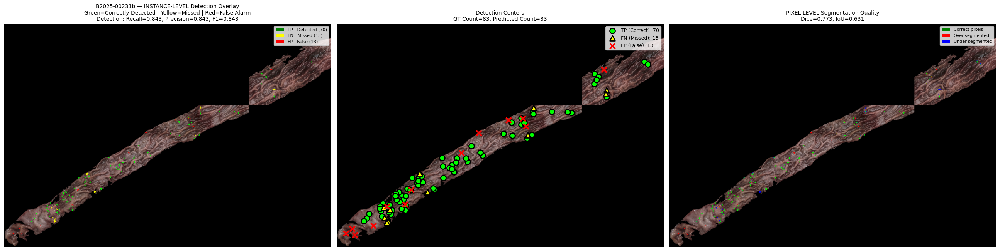


Processing B2025-00143b ...
  SEG  Dice=0.774, IoU=0.631, P=0.780, R=0.768
  DET  R=0.797, P=0.775, F1=0.786
       GT=69 Pred=71  TP=55 FN=14 FP=16


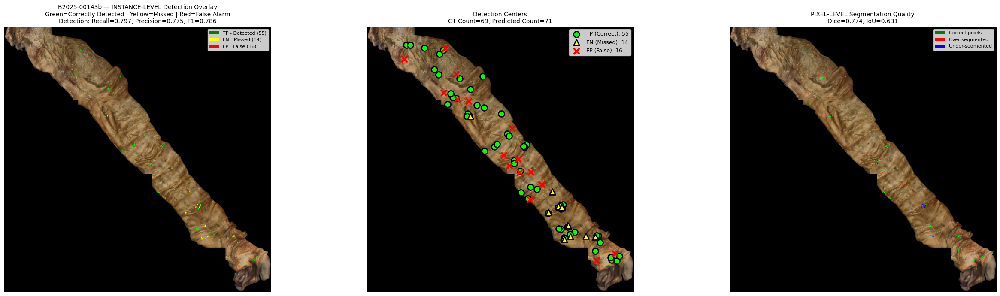


Processing B2025-00206b ...
  SEG  Dice=0.810, IoU=0.681, P=0.795, R=0.826
  DET  R=0.946, P=0.875, F1=0.909
       GT=37 Pred=40  TP=35 FN=2 FP=5


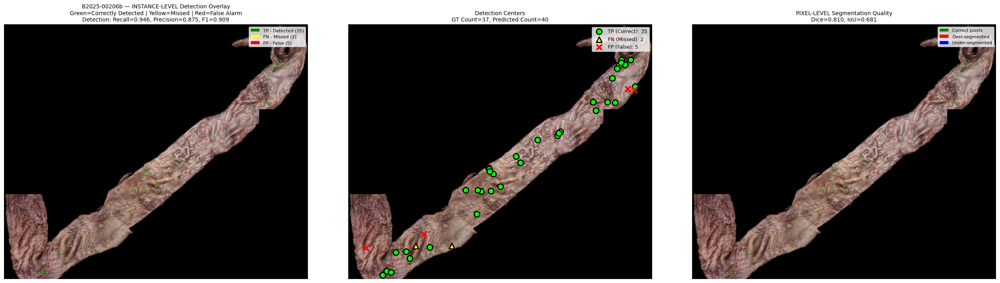


Processing B2025-00136b ...
  SEG  Dice=0.821, IoU=0.697, P=0.849, R=0.795
  DET  R=0.748, P=0.902, F1=0.818
       GT=321 Pred=266  TP=240 FN=81 FP=26


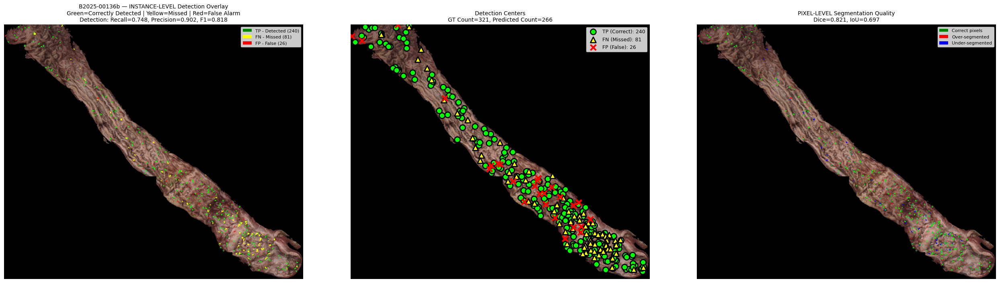


Processing B2025-00085.2 ...
  SEG  Dice=0.685, IoU=0.521, P=0.572, R=0.854
  DET  R=0.741, P=0.890, F1=0.809
       GT=263 Pred=219  TP=195 FN=68 FP=24


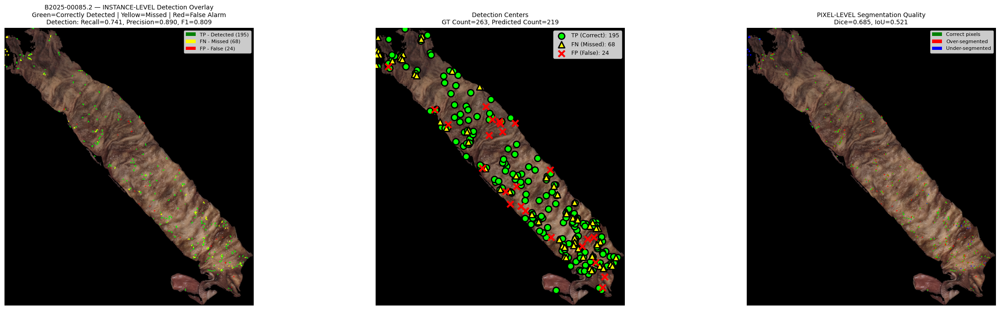


Processing B2025-00142a ...
  SEG  Dice=0.687, IoU=0.524, P=0.751, R=0.633
  DET  R=0.667, P=0.800, F1=0.727
       GT=6 Pred=5  TP=4 FN=2 FP=1


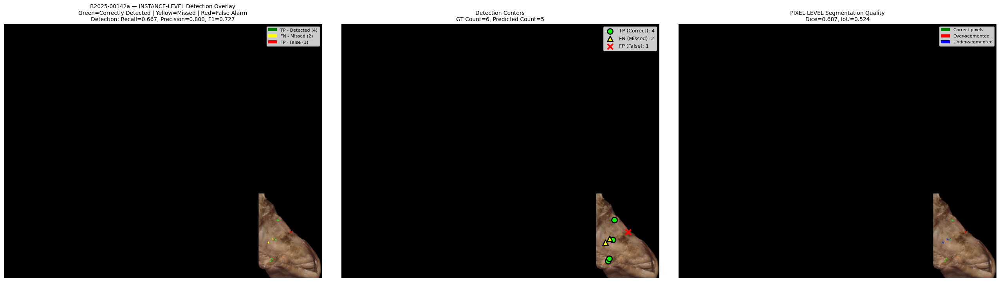


METRIC                         VALUE           DESCRIPTION
----------------------------------------------------------------------------------------------------

PIXEL-LEVEL SEGMENTATION METRICS (averaged across images):
----------------------------------------------------------------------------------------------------
Dice Coefficient               0.7587          Overlap quality (higher = better)
IoU (Jaccard Index)            0.6142          Intersection over Union
Pixel Precision                0.7557          Correct parasite pixels / Predicted parasite pixels
Pixel Recall                   0.7731          Correct parasite pixels / GT parasite pixels

INSTANCE-LEVEL DETECTION METRICS (total counts across all images):
----------------------------------------------------------------------------------------------------
Total GT Parasites             779             Ground truth parasite count
Total Predicted                684             Model predicted count
True Positives (TP)   

In [ ]:
evaluate_full_images(fine_tuner=eval_fine_tuner,
                     splits=splits,
                     test_dataset=test_dataset)

### Test what the metrics return

In [ ]:
def explain_metrics_with_example(fine_tuner, test_dataset, tile_idx=0):
    """
    Visual explanation of how TP/FP/FN are computed at both levels
    """
    sample = test_dataset.samples[tile_idx]

    # Load data
    image = cv2.imread(sample['tile_path'])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    mask_gt = cv2.imread(sample['mask_path'], cv2.IMREAD_GRAYSCALE)
    binary_mask_gt = (mask_gt > 127).astype(np.uint8)

    label_path = sample['mask_path'].replace('masks', 'labels')
    if os.path.exists(label_path):
        labels_gt = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
        gt_count, gt_centers, _ = count_parasites_ground_truth(labels_gt)
    else:
        labels_gt = None
        gt_count, gt_centers = sample['num_parasites'], []

    # Get prediction
    image_tensor = torch.from_numpy(image).permute(2, 0, 1).float() / 255.0
    image_tensor = image_tensor.unsqueeze(0).to(fine_tuner.device)
    pred_mask = predict_mask(fine_tuner, image_tensor)

    # PIXEL-LEVEL metrics
    pixel_tp = np.sum((pred_mask == 1) & (binary_mask_gt == 1))
    pixel_fp = np.sum((pred_mask == 1) & (binary_mask_gt == 0))
    pixel_fn = np.sum((pred_mask == 0) & (binary_mask_gt == 1))
    pixel_tn = np.sum((pred_mask == 0) & (binary_mask_gt == 0))

    total_pixels = pred_mask.size

    # INSTANCE-LEVEL metrics
    pred_count, pred_centers, _, _ = count_parasites_prediction(pred_mask)

    if gt_centers:
        TP_matches, FN_centers, FP_centers = match_parasites(gt_centers, pred_centers, max_distance=20)
        instance_tp = len(TP_matches)
        instance_fn = len(FN_centers)
        instance_fp = len(FP_centers)
    else:
        instance_tp, instance_fn, instance_fp = 0, 0, len(pred_centers)
        TP_matches, FN_centers, FP_centers = [], [], pred_centers

    # Visualize
    fig = plt.figure(figsize=(22, 12))
    gs = fig.add_gridspec(3, 3, hspace=0.3, wspace=0.4)

    # Title
    fig.suptitle(f"How TP/FP/FN are Measured - {sample['tile_id']}", fontsize=16, fontweight='bold')

    # Row 1: Inputs
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.imshow(image)
    ax1.set_title("Original Image")
    ax1.axis('off')

    ax2 = fig.add_subplot(gs[0, 1])
    ax2.imshow(binary_mask_gt, cmap='gray')
    ax2.set_title(f"Ground Truth Mask\n({gt_count} parasites)")
    ax2.axis('off')

    ax3 = fig.add_subplot(gs[0, 2])
    ax3.imshow(pred_mask, cmap='gray')
    ax3.set_title(f"Predicted Mask\n({pred_count} detected)")
    ax3.axis('off')

    # Row 2: PIXEL-LEVEL
    ax4 = fig.add_subplot(gs[1, :])

    # Create pixel-level visualization
    pixel_vis = np.zeros((*image.shape[:2], 3), dtype=np.float32)
    pixel_vis[(pred_mask == 1) & (binary_mask_gt == 1)] = [0, 1, 0]     # TP - Green
    pixel_vis[(pred_mask == 1) & (binary_mask_gt == 0)] = [1, 0, 0]     # FP - Red
    pixel_vis[(pred_mask == 0) & (binary_mask_gt == 1)] = [0, 0, 1]     # FN - Blue
    pixel_vis[(pred_mask == 0) & (binary_mask_gt == 0)] = [0.3, 0.3, 0.3]  # TN - Gray

    ax4.imshow(pixel_vis)
    ax4.set_title("PIXEL-LEVEL Classification", fontsize=14, fontweight='bold')
    ax4.axis('off')

    from matplotlib.patches import Patch
    pixel_legend = [
        Patch(facecolor='green', label=f'TP: {pixel_tp:,} pixels (pred=1, gt=1)'),
        Patch(facecolor='red', label=f'FP: {pixel_fp:,} pixels (pred=1, gt=0)'),
        Patch(facecolor='blue', label=f'FN: {pixel_fn:,} pixels (pred=0, gt=1)'),
        Patch(facecolor='gray', label=f'TN: {pixel_tn:,} pixels (pred=0, gt=0)')
    ]

    ax4.legend(
        handles=pixel_legend,
        loc='center left',
        bbox_to_anchor=(1.15, 0.5),   # ← push legend far outside the subplot
        fontsize=10,
        frameon=True
    )

    # Row 3: INSTANCE-LEVEL
    ax5 = fig.add_subplot(gs[2, :])
    ax5.imshow(image)

    # Draw GT centers and predictions with matching
    if TP_matches:
        # Draw lines connecting matched pairs
        for gt_center, pred_center, dist in TP_matches:
            ax5.plot([gt_center[0], pred_center[0]], [gt_center[1], pred_center[1]],
                    'g-', linewidth=2, alpha=0.5)
            # Draw the centers
            ax5.scatter(gt_center[0], gt_center[1], c='lime', s=150, marker='o',
                       edgecolors='black', linewidths=2, zorder=3)
            ax5.scatter(pred_center[0], pred_center[1], c='lime', s=100, marker='x',
                       linewidths=3, zorder=3)

    if FN_centers:
        xs, ys = zip(*[(c[0], c[1]) for c in FN_centers])
        ax5.scatter(xs, ys, c='yellow', s=150, marker='^',
                   edgecolors='black', linewidths=2, zorder=3)

    if FP_centers:
        xs, ys = zip(*[(c[0], c[1]) for c in FP_centers])
        ax5.scatter(xs, ys, c='red', s=100, marker='x', linewidths=3, zorder=3)

    ax5.set_title("INSTANCE-LEVEL Detection (Parasite Counting)", fontsize=14, fontweight='bold')
    ax5.axis('off')

    instance_legend = [
        Patch(facecolor='lime', label=f'TP: {instance_tp} parasites (matched within 20px)'),
        Patch(facecolor='yellow', label=f'FN: {instance_fn} parasites (GT not matched - MISSED)'),
        Patch(facecolor='red', label=f'FP: {instance_fp} parasites (Pred not matched - FALSE ALARM)')
    ]
    ax5.legend(handles=instance_legend, loc='center left', bbox_to_anchor=(1, 1), fontsize=10)

    plt.show()

    # Print summary
    print(f"METRICS EXPLANATION FOR: {sample['tile_id']}")

    print("1. PIXEL-LEVEL METRICS (Segmentation Quality)")
    print("   Each pixel is classified independently:")
    print(f"   TP (True Positive):   {pixel_tp:,} pixels predicted as parasite AND are parasite")
    print(f"   FP (False Positive):  {pixel_fp:,} pixels predicted as parasite BUT are background")
    print(f"   FN (False Negative):  {pixel_fn:,} pixels predicted as background BUT are parasite")
    print(f"   TN (True Negative):   {pixel_tn:,} pixels predicted as background AND are background")
    print(f"   Total pixels: {total_pixels:,}")

    seg_metrics = calculate_segmentation_metrics(pred_mask, binary_mask_gt)
    print(f"\n   → Dice = {seg_metrics['dice']:.4f}")
    print(f"   → IoU  = {seg_metrics['iou']:.4f}")
    print(f"   → Pixel Precision = {seg_metrics['precision']:.4f}")
    print(f"   → Pixel Recall    = {seg_metrics['recall']:.4f}")

    print(f"\n2. INSTANCE-LEVEL METRICS (Detection/Counting)")
    print("   Each parasite is evaluated as a whole object:")
    print(f"   TP (True Positive):   {instance_tp} parasites correctly detected")
    print(f"                           (GT has matching prediction within 20 pixels)")
    print(f"   FN (False Negative):  {instance_fn} parasites MISSED by the model")
    print(f"                           (GT has no matching prediction)")
    print(f"   FP (False Positive):  {instance_fp} FALSE ALARMS")
    print(f"                           (Prediction has no matching GT)")
    print(f"   (Note: TN doesn't exist at instance level)")

    if gt_centers:
        det_recall = instance_tp / max(gt_count, 1)
        det_precision = instance_tp / max(pred_count, 1)
        det_f1 = 2 * det_recall * det_precision / max(det_recall + det_precision, 1e-6)
        print(f"\n   → Detection Recall    = {det_recall:.4f} ({instance_tp}/{gt_count})")
        print(f"   → Detection Precision = {det_precision:.4f} ({instance_tp}/{pred_count})")
        print(f"   → Detection F1        = {det_f1:.4f}")

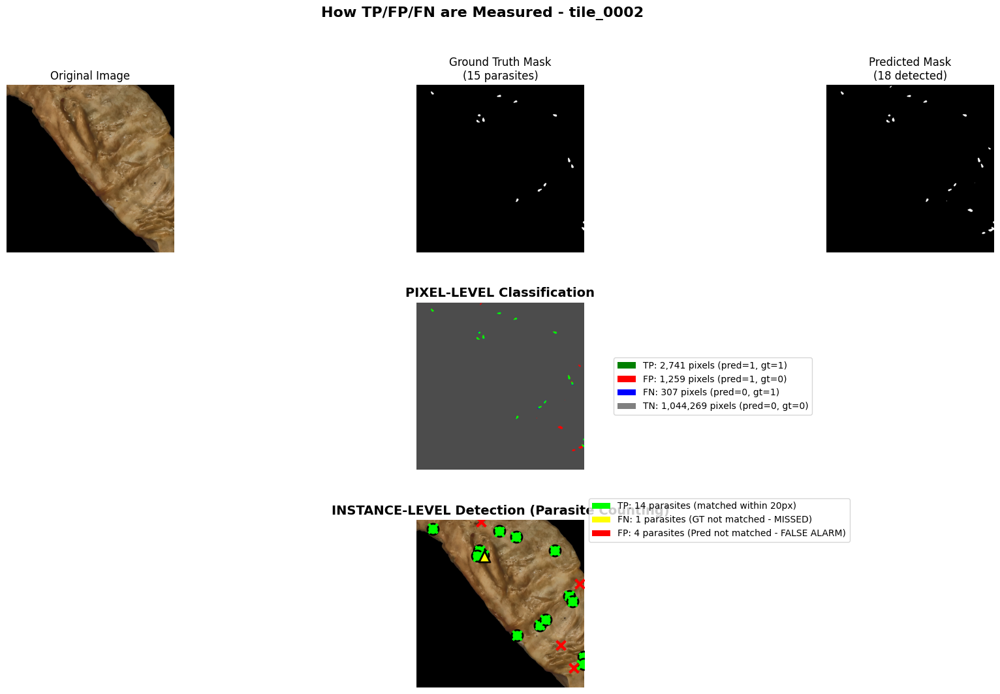

METRICS EXPLANATION FOR: tile_0002
1. PIXEL-LEVEL METRICS (Segmentation Quality)
   Each pixel is classified independently:
   TP (True Positive):   2,741 pixels predicted as parasite AND are parasite
   FP (False Positive):  1,259 pixels predicted as parasite BUT are background
   FN (False Negative):  307 pixels predicted as background BUT are parasite
   TN (True Negative):   1,044,269 pixels predicted as background AND are background
   Total pixels: 1,048,576

   → Dice = 0.7778
   → IoU  = 0.6364
   → Pixel Precision = 0.6852
   → Pixel Recall    = 0.8993

2. INSTANCE-LEVEL METRICS (Detection/Counting)
   Each parasite is evaluated as a whole object:
   TP (True Positive):   14 parasites correctly detected
                           (GT has matching prediction within 20 pixels)
   FN (False Negative):  1 parasites MISSED by the model
                           (GT has no matching prediction)
   FP (False Positive):  4 FALSE ALARMS
                           (Prediction has no mat

In [ ]:
explain_metrics_with_example(eval_fine_tuner, test_dataset, tile_idx=8)

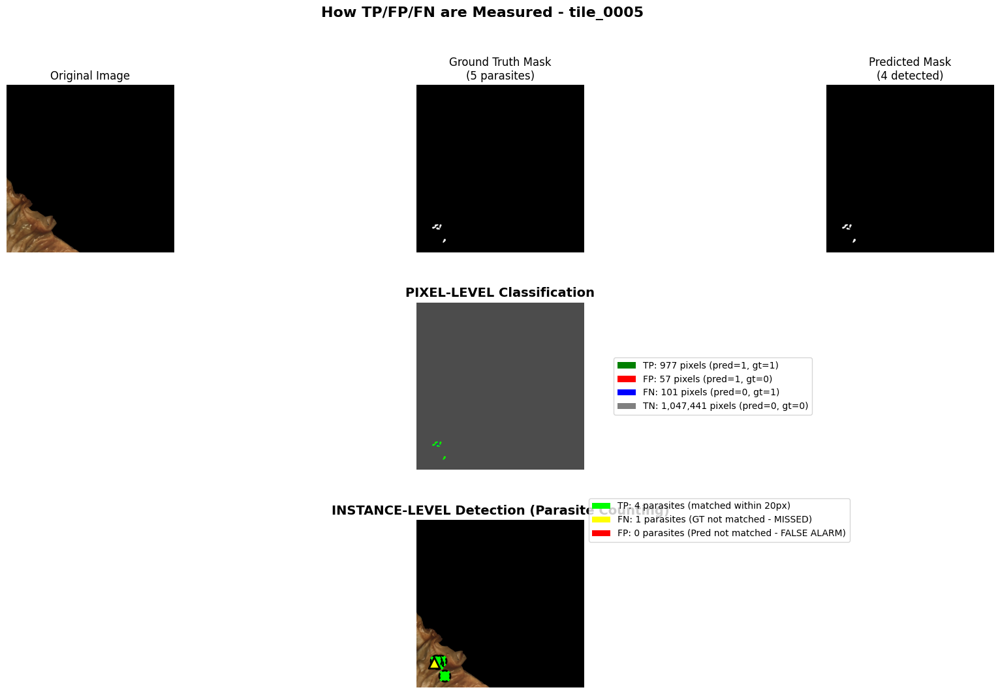

METRICS EXPLANATION FOR: tile_0005
1. PIXEL-LEVEL METRICS (Segmentation Quality)
   Each pixel is classified independently:
   TP (True Positive):   977 pixels predicted as parasite AND are parasite
   FP (False Positive):  57 pixels predicted as parasite BUT are background
   FN (False Negative):  101 pixels predicted as background BUT are parasite
   TN (True Negative):   1,047,441 pixels predicted as background AND are background
   Total pixels: 1,048,576

   → Dice = 0.9252
   → IoU  = 0.8608
   → Pixel Precision = 0.9449
   → Pixel Recall    = 0.9063

2. INSTANCE-LEVEL METRICS (Detection/Counting)
   Each parasite is evaluated as a whole object:
   TP (True Positive):   4 parasites correctly detected
                           (GT has matching prediction within 20 pixels)
   FN (False Negative):  1 parasites MISSED by the model
                           (GT has no matching prediction)
   FP (False Positive):  0 FALSE ALARMS
                           (Prediction has no matching 

In [ ]:
explain_metrics_with_example(eval_fine_tuner, test_dataset, tile_idx=11)

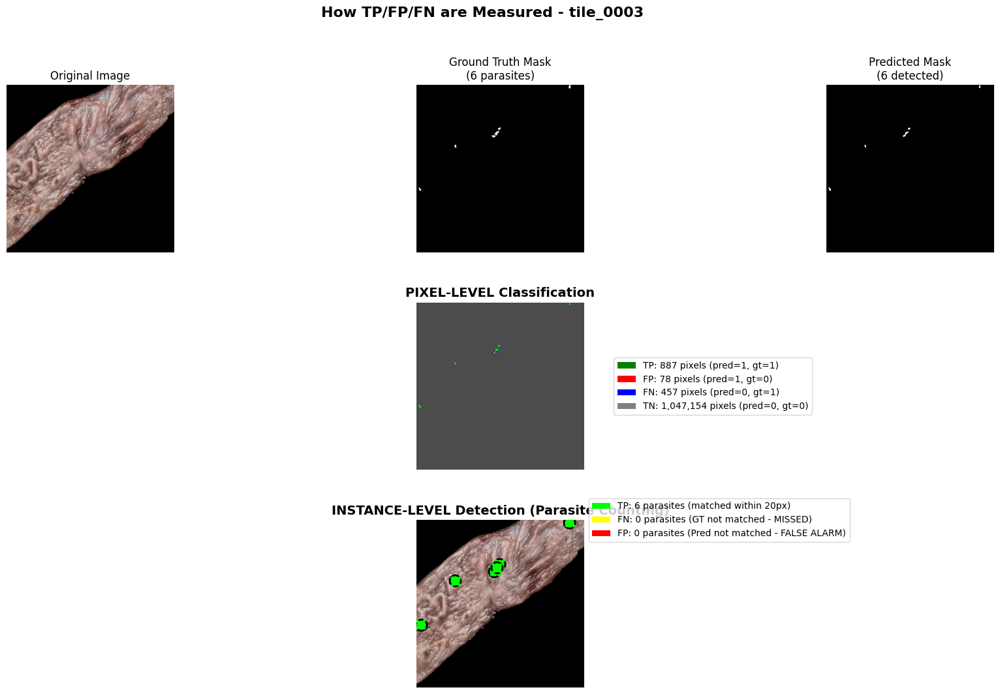

METRICS EXPLANATION FOR: tile_0003
1. PIXEL-LEVEL METRICS (Segmentation Quality)
   Each pixel is classified independently:
   TP (True Positive):   887 pixels predicted as parasite AND are parasite
   FP (False Positive):  78 pixels predicted as parasite BUT are background
   FN (False Negative):  457 pixels predicted as background BUT are parasite
   TN (True Negative):   1,047,154 pixels predicted as background AND are background
   Total pixels: 1,048,576

   → Dice = 0.7683
   → IoU  = 0.6238
   → Pixel Precision = 0.9192
   → Pixel Recall    = 0.6600

2. INSTANCE-LEVEL METRICS (Detection/Counting)
   Each parasite is evaluated as a whole object:
   TP (True Positive):   6 parasites correctly detected
                           (GT has matching prediction within 20 pixels)
   FN (False Negative):  0 parasites MISSED by the model
                           (GT has no matching prediction)
   FP (False Positive):  0 FALSE ALARMS
                           (Prediction has no matching 

In [ ]:
explain_metrics_with_example(eval_fine_tuner, test_dataset, tile_idx=16)

## Exp 7 — Recall instead of Dice to select the best model LoRA 32, AdamW, pos_weight=2.0

In [ ]:
class SAMFineTuner_LoRA:

    def __init__(self, sam_model, device, learning_rate=1e-4, lora_rank=8,
                optimizer_type='adam', weight_decay=1e-4,
                bce_weight=1.0, dice_weight=1.0, grad_clip=None,
                pos_weight=1.0):
        """
        SAM Fine-tuner with LoRA
        Args:
            sam_model: SAM model
            device: cuda or cpu
            learning_rate: Learning rate (default 1e-4)
            lora_rank: LoRA rank (default 8)
            optimizer_type: 'adam', 'adamw', or 'sgd' (default 'adam')
            weight_decay: Weight decay for optimizer (default 1e-4)
            bce_weight: Weight for BCE loss (default 1.0)
            dice_weight: Weight for Dice loss (default 1.0)
            grad_clip: Gradient clipping max norm (default None)
            pos_weight: Positive class weight for BCE loss (default 1.0)  # ⭐ ADDED
                      >1.0 penalizes false negatives more (prioritize recall)
        """
        self.sam = sam_model
        self.device = device
        self.lora_rank = lora_rank
        self.grad_clip = grad_clip
        self.bce_weight = bce_weight
        self.dice_weight = dice_weight
        self.pos_weight = pos_weight

        # Apply LoRA to image encoder
        self._apply_lora_to_image_encoder()

        # Freeze base image encoder parameters (LoRA params will be trainable)
        for name, param in self.sam.image_encoder.named_parameters():
            if 'lora' not in name:
                param.requires_grad = False
            else:
                param.requires_grad = True

        # Freeze prompt encoder
        for param in self.sam.prompt_encoder.parameters():
            param.requires_grad = False

        # Train mask decoder fully
        for param in self.sam.mask_decoder.parameters():
            param.requires_grad = True

        # Setup optimizer (LoRA params + mask decoder)
        lora_params = [p for n, p in self.sam.image_encoder.named_parameters()
                      if 'lora' in n and p.requires_grad]
        decoder_params = list(self.sam.mask_decoder.parameters())
        trainable_params = lora_params + decoder_params

        if optimizer_type.lower() == 'adam':
            self.optimizer = torch.optim.Adam(
                trainable_params,
                lr=learning_rate
            )
        elif optimizer_type.lower() == 'adamw':
            self.optimizer = torch.optim.AdamW(
                trainable_params,
                lr=learning_rate,
                weight_decay=weight_decay
            )
        elif optimizer_type.lower() == 'sgd':
            self.optimizer = torch.optim.SGD(
                trainable_params,
                lr=learning_rate,
                momentum=0.9,
                weight_decay=weight_decay
            )
        else:
            raise ValueError(f"Unknown optimizer: {optimizer_type}")

        # Loss functions
        if pos_weight > 1.0:
            self.bce_loss = nn.BCEWithLogitsLoss(
                pos_weight=torch.tensor([pos_weight]).to(device)
            )
            print(f"Using pos_weight={pos_weight} (prioritizing detection recall)")
        else:
            self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_loss = self.dice_loss_fn

        # Count trainable parameters
        total_params = sum(p.numel() for p in self.sam.parameters())
        trainable_params_count = sum(p.numel() for p in self.sam.parameters() if p.requires_grad)
        lora_params_count = sum(p.numel() for p in lora_params)

        print(f"Trainable parameters:    {trainable_params_count:,}({100*trainable_params_count/total_params:.2f}%)")
        print(f"  - LoRA parameters:     {lora_params_count:,}")
        print(f"  - Decoder parameters:  {trainable_params_count - lora_params_count:,}")


    def _apply_lora_to_image_encoder(self):
        """Apply LoRA to attention layers in image encoder"""
        for block_idx, block in enumerate(self.sam.image_encoder.blocks):
            attn = block.attn
            original_qkv = attn.qkv
            in_features = original_qkv.in_features
            out_features = original_qkv.out_features

            # Store original weights
            original_weight = original_qkv.weight.data.clone()
            original_bias = original_qkv.bias.data.clone() if original_qkv.bias is not None else None

            # Create LoRA layer
            lora_qkv = lora.Linear(
                in_features,
                out_features,
                r=self.lora_rank,
                lora_alpha=self.lora_rank * 2,
                lora_dropout=0.1,
                merge_weights=False,
                bias=original_qkv.bias is not None
            )

            # Copy weights properly without disrupting LoRA initialization
            with torch.no_grad():
                lora_qkv.weight.copy_(original_weight)
                if original_bias is not None:
                    lora_qkv.bias.copy_(original_bias)

            # Move to device and assign
            attn.qkv = lora_qkv.to(self.device)

        print(f"Applied LoRA (rank={self.lora_rank}) to {len(self.sam.image_encoder.blocks)} transformer blocks")


    def dice_loss_fn(self, pred, target, smooth=1e-5):
        """Dice loss for segmentation"""
        pred = torch.sigmoid(pred)
        intersection = (pred * target).sum(dim=(2, 3))
        union = pred.sum(dim=(2, 3)) + target.sum(dim=(2, 3))
        dice = (2. * intersection + smooth) / (union + smooth)
        return 1 - dice.mean()

    def compute_metrics(self, pred, target, threshold=0.5):
            """
            Compute metric components (tp, fp, fn, tn) for accumulation
            Returns raw counts, not final metrics
            """
            pred_binary = (torch.sigmoid(pred) > threshold).float()
            target_binary = target.float()

            pred_flat = pred_binary.view(-1)
            target_flat = target_binary.view(-1)

            tp = (pred_flat * target_flat).sum()
            fp = (pred_flat * (1 - target_flat)).sum()
            fn = ((1 - pred_flat) * target_flat).sum()
            tn = ((1 - pred_flat) * (1 - target_flat)).sum()

            return {
                'tp': tp.item(),
                'fp': fp.item(),
                'fn': fn.item(),
                'tn': tn.item()
            }

    @staticmethod
    def compute_final_metrics(total_tp, total_fp, total_fn, total_tn):
        """
        Compute final metrics from accumulated tp, fp, fn, tn
        """
        smooth = 1e-7
        iou = (total_tp + smooth) / (total_tp + total_fp + total_fn + smooth)
        dice = (2 * total_tp + smooth) / (2 * total_tp + total_fp + total_fn + smooth)
        precision = (total_tp + smooth) / (total_tp + total_fp + smooth)
        recall = (total_tp + smooth) / (total_tp + total_fn + smooth)
        f1 = (2 * precision * recall) / (precision + recall + smooth)

        return {
            'iou': iou,
            'dice': dice,
            'precision': precision,
            'recall': recall,
            'f1': f1
        }

    def train_step(self, batch):
        """Training step with configurable loss weights and gradient clipping"""
        self.sam.train()
        self.optimizer.zero_grad() # Clear previous gradients

        # Forward pass
        images = batch['image'].to(self.device)
        masks_gt = batch['mask'].to(self.device)

        # Get image embeddings (with LoRA)
        image_embeddings = self.sam.image_encoder(images)

        # Get sparse embeddings (no prompt)
        sparse_embeddings, dense_embeddings = self.sam.prompt_encoder(
            points=None, boxes=None, masks=None
        )

        # Ensure embeddings are on correct device
        sparse_embeddings = sparse_embeddings.to(self.device)
        dense_embeddings = dense_embeddings.to(self.device)

        # Predict masks
        low_res_masks, _ = self.sam.mask_decoder(
            image_embeddings=image_embeddings,
            image_pe=self.sam.prompt_encoder.get_dense_pe(),
            sparse_prompt_embeddings=sparse_embeddings,
            dense_prompt_embeddings=dense_embeddings,
            multimask_output=False
        )

        pred_masks = F.interpolate(
            low_res_masks,
            size=masks_gt.shape[-2:],
            mode='bilinear',
            align_corners=False
        )

        # Calculate losses with configurable weights
        loss_bce = self.bce_loss(pred_masks, masks_gt)
        loss_dice = self.dice_loss(pred_masks, masks_gt)
        loss = self.bce_weight * loss_bce + self.dice_weight * loss_dice

        # Backward
        loss.backward() # Compute gradients for trainable params only

        # Gradient clipping
        if self.grad_clip:
            torch.nn.utils.clip_grad_norm_(
                [p for p in self.sam.parameters() if p.requires_grad],
                max_norm=self.grad_clip
            )

        self.optimizer.step() # Update weights

        # Compute metric components
        with torch.no_grad():
            metric_components = self.compute_metrics(pred_masks, masks_gt)

        return {
            'loss': loss.item(),
            'loss_bce': loss_bce.item(),
            'loss_dice': loss_dice.item(),
            **metric_components
        }

    @torch.no_grad()
    def val_step(self, batch):
        """Validation step (no gradients)"""
        self.sam.eval()

        images = batch['image'].to(self.device)
        masks_gt = batch['mask'].to(self.device)

        image_embeddings = self.sam.image_encoder(images)
        sparse_embeddings, dense_embeddings = self.sam.prompt_encoder(
            points=None, boxes=None, masks=None
        )

        # Ensure embeddings are on correct device
        sparse_embeddings = sparse_embeddings.to(self.device)
        dense_embeddings = dense_embeddings.to(self.device)

        low_res_masks, _ = self.sam.mask_decoder(
            image_embeddings=image_embeddings,
            image_pe=self.sam.prompt_encoder.get_dense_pe(),
            sparse_prompt_embeddings=sparse_embeddings,
            dense_prompt_embeddings=dense_embeddings,
            multimask_output=False
        )

        pred_masks = F.interpolate(
            low_res_masks,
            size=masks_gt.shape[-2:],
            mode='bilinear',
            align_corners=False
        )

        loss_bce = self.bce_loss(pred_masks, masks_gt)
        loss_dice = self.dice_loss(pred_masks, masks_gt)
        loss = self.bce_weight * loss_bce + self.dice_weight * loss_dice

        metric_components = self.compute_metrics(pred_masks, masks_gt)

        return {
            'loss': loss.item(),
            'loss_bce': loss_bce.item(),
            'loss_dice': loss_dice.item(),
            **metric_components
        }

    def save_checkpoint(self, path):
        """Save fine-tuned model with LoRA weights"""
        torch.save({
            'mask_decoder': self.sam.mask_decoder.state_dict(),
            'lora_state': {n: p.data for n, p in self.sam.image_encoder.named_parameters() if 'lora' in n},
            'optimizer': self.optimizer.state_dict()
        }, path)
        print(f"Checkpoint saved to {path}")

    def load_checkpoint(self, path, load_optimizer=True):
        """Load fine-tuned model with LoRA weights"""
        checkpoint = torch.load(path, map_location=self.device)
        self.sam.mask_decoder.load_state_dict(checkpoint['mask_decoder'])


        if 'lora_state' in checkpoint:
            for name, param in self.sam.image_encoder.named_parameters():
                if name in checkpoint['lora_state']:
                    param.data.copy_(checkpoint['lora_state'][name])

        # Option to load optimizer state for resuming training
        if load_optimizer and 'optimizer' in checkpoint:
            self.optimizer.load_state_dict(checkpoint['optimizer'])
            print("Optimizer state loaded")

        print(f"Checkpoint loaded from {path}")

In [ ]:
import torch.serialization
torch.serialization.add_safe_globals([np.core.multiarray.scalar])

# Load best checkpoint
best_checkpoint_path = "/content/drive/MyDrive/SAM_Parasite_Detection/checkpoints/recall_new_split_LoRA_Rank64/sam_best.pth"
checkpoint = torch.load(best_checkpoint_path, map_location=device, weights_only=False)

print(f"Loaded best model from epoch {checkpoint['epoch']}")

sam_model, device = load_sam_model()

# Create fine_tuner with same config as training
eval_fine_tuner = SAMFineTuner_LoRA(
    sam_model=sam_model,
    lora_rank=checkpoint['lora_rank'],
    learning_rate=1e-4,
    bce_weight=checkpoint['bce_weight'],
    dice_weight=checkpoint['dice_weight'],
    device=device
)

# Load the trained weights
eval_fine_tuner.sam.load_state_dict(checkpoint['model_state_dict'])
with torch.no_grad():
    eval_fine_tuner.sam.eval()

Loaded best model from epoch 9
Applied LoRA (rank=32) to 12 transformer blocks
Trainable parameters:    5,237,988(5.52%)
  - LoRA parameters:     1,179,648
  - Decoder parameters:  4,058,340



Processing B2025-00231b ...
  SEG  Dice=0.744, IoU=0.593, P=0.797, R=0.698
  DET  R=0.795, P=0.880, F1=0.835
       GT=83 Pred=75  TP=66 FN=17 FP=9


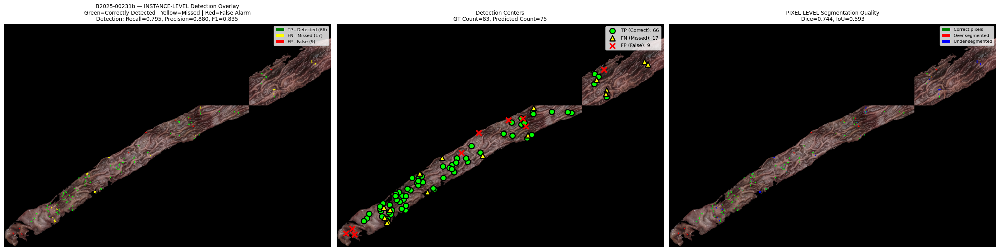


Processing B2025-00143b ...
  SEG  Dice=0.743, IoU=0.591, P=0.714, R=0.774
  DET  R=0.797, P=0.733, F1=0.764
       GT=69 Pred=75  TP=55 FN=14 FP=20


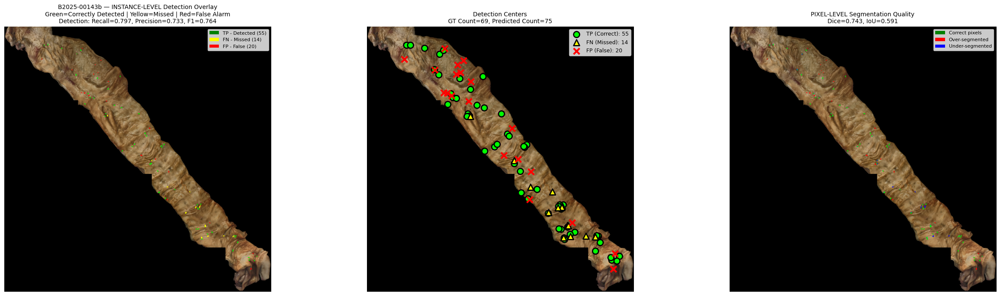


Processing B2025-00206b ...
  SEG  Dice=0.826, IoU=0.704, P=0.875, R=0.782
  DET  R=0.892, P=0.943, F1=0.917
       GT=37 Pred=35  TP=33 FN=4 FP=2


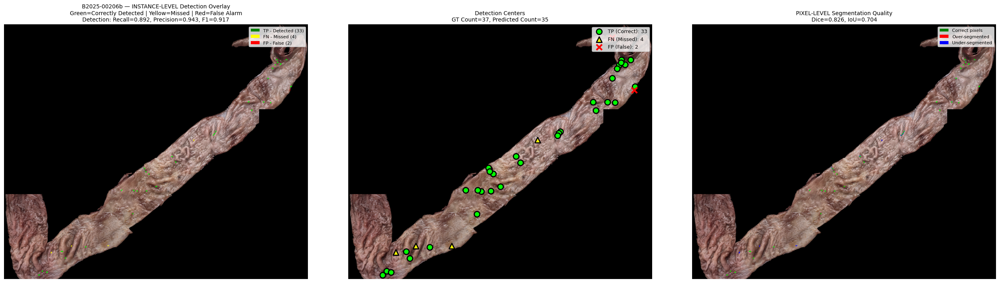


Processing B2025-00136b ...
  SEG  Dice=0.830, IoU=0.710, P=0.867, R=0.796
  DET  R=0.754, P=0.920, F1=0.829
       GT=321 Pred=263  TP=242 FN=79 FP=21


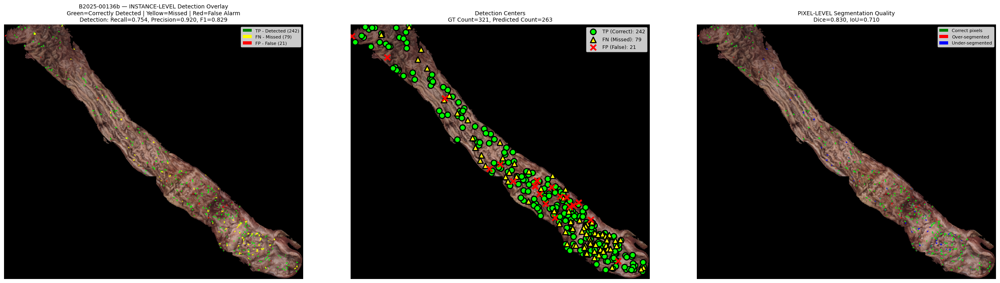


Processing B2025-00085.2 ...
  SEG  Dice=0.705, IoU=0.545, P=0.609, R=0.837
  DET  R=0.726, P=0.960, F1=0.827
       GT=263 Pred=199  TP=191 FN=72 FP=8


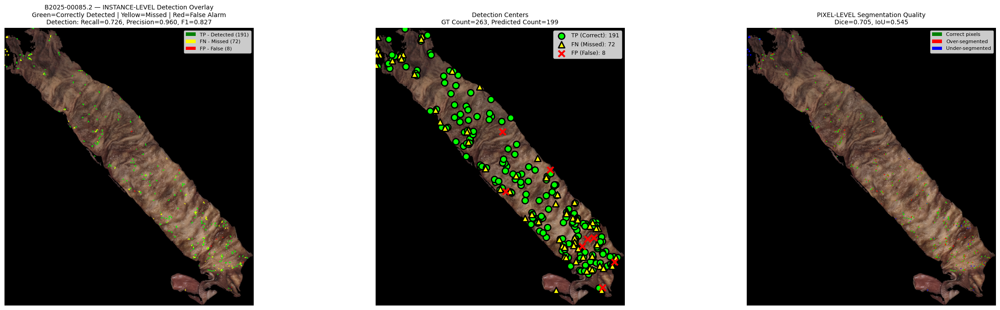


Processing B2025-00142a ...
  SEG  Dice=0.788, IoU=0.651, P=0.798, R=0.779
  DET  R=1.000, P=0.857, F1=0.923
       GT=6 Pred=7  TP=6 FN=0 FP=1


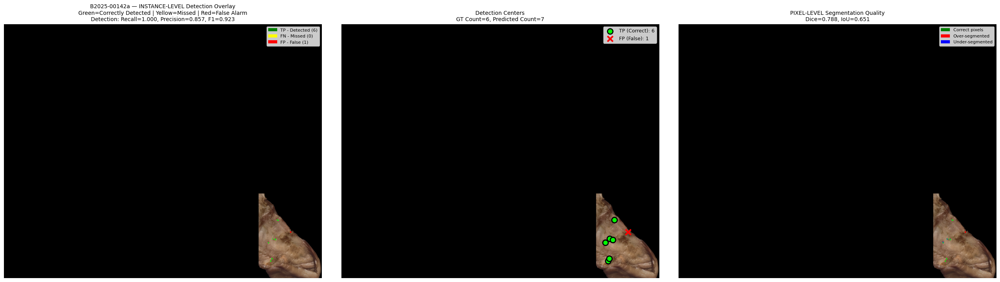


METRIC                         VALUE           DESCRIPTION
----------------------------------------------------------------------------------------------------

PIXEL-LEVEL SEGMENTATION METRICS (averaged across images):
----------------------------------------------------------------------------------------------------
Dice Coefficient               0.7728          Overlap quality (higher = better)
IoU (Jaccard Index)            0.6321          Intersection over Union
Pixel Precision                0.7767          Correct parasite pixels / Predicted parasite pixels
Pixel Recall                   0.7779          Correct parasite pixels / GT parasite pixels

INSTANCE-LEVEL DETECTION METRICS (total counts across all images):
----------------------------------------------------------------------------------------------------
Total GT Parasites             779             Ground truth parasite count
Total Predicted                654             Model predicted count
True Positives (TP)   

In [ ]:
evaluate_full_images(fine_tuner=eval_fine_tuner,
                     splits=splits,
                     test_dataset=test_dataset)

## Exp 10 — Focal Loss, LoRA 32, Adam

In [15]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class FocalLoss(nn.Module):
    """
    Focal Loss - automatically focuses on hard examples (missed parasites)
    """
    def __init__(self, alpha=0.25, gamma=2.0):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma

    def forward(self, pred, target):
        # Binary cross entropy per pixel
        bce = F.binary_cross_entropy_with_logits(pred, target, reduction='none')

        # Probability of correct prediction
        pt = torch.exp(-bce)

        # Focal term: (1-pt)^gamma
        focal_loss = self.alpha * (1 - pt) ** self.gamma * bce

        return focal_loss.mean()


In [16]:
class SAMFineTuner_LoRA:

    def __init__(self, sam_model, device, learning_rate=1e-4, lora_rank=8,
                optimizer_type='adam', weight_decay=1e-4,
                bce_weight=1.0, dice_weight=1.0, grad_clip=None,
                pos_weight=1.0):
        """
        SAM Fine-tuner with LoRA
        Args:
            sam_model: SAM model
            device: cuda or cpu
            learning_rate: Learning rate (default 1e-4)
            lora_rank: LoRA rank (default 8)
            optimizer_type: 'adam', 'adamw', or 'sgd' (default 'adam')
            weight_decay: Weight decay for optimizer (default 1e-4)
            bce_weight: Weight for BCE loss (default 1.0)
            dice_weight: Weight for Dice loss (default 1.0)
            grad_clip: Gradient clipping max norm (default None)
            pos_weight: Positive class weight for BCE loss (default 1.0)
                      >1.0 penalizes false negatives more (prioritize recall)
        """
        self.sam = sam_model
        self.device = device
        self.lora_rank = lora_rank
        self.grad_clip = grad_clip
        self.bce_weight = bce_weight
        self.dice_weight = dice_weight
        self.pos_weight = pos_weight

        # Apply LoRA to image encoder
        self._apply_lora_to_image_encoder()

        # Freeze base image encoder parameters (LoRA params will be trainable)
        for name, param in self.sam.image_encoder.named_parameters():
            if 'lora' not in name:
                param.requires_grad = False
            else:
                param.requires_grad = True

        # Freeze prompt encoder
        for param in self.sam.prompt_encoder.parameters():
            param.requires_grad = False

        # Train mask decoder fully
        for param in self.sam.mask_decoder.parameters():
            param.requires_grad = True

        # Setup optimizer (LoRA params + mask decoder)
        lora_params = [p for n, p in self.sam.image_encoder.named_parameters()
                      if 'lora' in n and p.requires_grad]
        decoder_params = list(self.sam.mask_decoder.parameters())
        trainable_params = lora_params + decoder_params

        if optimizer_type.lower() == 'adam':
            self.optimizer = torch.optim.Adam(
                trainable_params,
                lr=learning_rate
            )
        elif optimizer_type.lower() == 'adamw':
            self.optimizer = torch.optim.AdamW(
                trainable_params,
                lr=learning_rate,
                weight_decay=weight_decay
            )
        elif optimizer_type.lower() == 'sgd':
            self.optimizer = torch.optim.SGD(
                trainable_params,
                lr=learning_rate,
                momentum=0.9,
                weight_decay=weight_decay
            )
        else:
            raise ValueError(f"Unknown optimizer: {optimizer_type}")

        # Loss functions
        self.bce_loss = FocalLoss(alpha=0.25, gamma=2.0)
        print(f"Using Focal Loss (alpha=0.25, gamma=2.0) - automatic hard example mining")

        self.dice_loss = self.dice_loss_fn

        # Count trainable parameters
        total_params = sum(p.numel() for p in self.sam.parameters())
        trainable_params_count = sum(p.numel() for p in self.sam.parameters() if p.requires_grad)
        lora_params_count = sum(p.numel() for p in lora_params)

        print(f"Trainable parameters:    {trainable_params_count:,}({100*trainable_params_count/total_params:.2f}%)")
        print(f"  - LoRA parameters:     {lora_params_count:,}")
        print(f"  - Decoder parameters:  {trainable_params_count - lora_params_count:,}")


    def _apply_lora_to_image_encoder(self):
        """Apply LoRA to attention layers in image encoder"""
        for block_idx, block in enumerate(self.sam.image_encoder.blocks):
            attn = block.attn
            original_qkv = attn.qkv
            in_features = original_qkv.in_features
            out_features = original_qkv.out_features

            # Store original weights
            original_weight = original_qkv.weight.data.clone()
            original_bias = original_qkv.bias.data.clone() if original_qkv.bias is not None else None

            # Create LoRA layer
            lora_qkv = lora.Linear(
                in_features,
                out_features,
                r=self.lora_rank,
                lora_alpha=self.lora_rank * 2,
                lora_dropout=0.1,
                merge_weights=False,
                bias=original_qkv.bias is not None
            )

            # Copy weights properly without disrupting LoRA initialization
            with torch.no_grad():
                lora_qkv.weight.copy_(original_weight)
                if original_bias is not None:
                    lora_qkv.bias.copy_(original_bias)

            # Move to device and assign
            attn.qkv = lora_qkv.to(self.device)

        print(f"Applied LoRA (rank={self.lora_rank}) to {len(self.sam.image_encoder.blocks)} transformer blocks")


    def dice_loss_fn(self, pred, target, smooth=1e-5):
        """Dice loss for segmentation"""
        pred = torch.sigmoid(pred)
        intersection = (pred * target).sum(dim=(2, 3))
        union = pred.sum(dim=(2, 3)) + target.sum(dim=(2, 3))
        dice = (2. * intersection + smooth) / (union + smooth)
        return 1 - dice.mean()

    def compute_metrics(self, pred, target, threshold=0.5):
            """
            Compute metric components (tp, fp, fn, tn) for accumulation
            Returns raw counts, not final metrics
            """
            pred_binary = (torch.sigmoid(pred) > threshold).float()
            target_binary = target.float()

            pred_flat = pred_binary.view(-1)
            target_flat = target_binary.view(-1)

            tp = (pred_flat * target_flat).sum()
            fp = (pred_flat * (1 - target_flat)).sum()
            fn = ((1 - pred_flat) * target_flat).sum()
            tn = ((1 - pred_flat) * (1 - target_flat)).sum()

            return {
                'tp': tp.item(),
                'fp': fp.item(),
                'fn': fn.item(),
                'tn': tn.item()
            }

    @staticmethod
    def compute_final_metrics(total_tp, total_fp, total_fn, total_tn):
        """
        Compute final metrics from accumulated tp, fp, fn, tn
        """
        smooth = 1e-7
        iou = (total_tp + smooth) / (total_tp + total_fp + total_fn + smooth)
        dice = (2 * total_tp + smooth) / (2 * total_tp + total_fp + total_fn + smooth)
        precision = (total_tp + smooth) / (total_tp + total_fp + smooth)
        recall = (total_tp + smooth) / (total_tp + total_fn + smooth)
        f1 = (2 * precision * recall) / (precision + recall + smooth)

        return {
            'iou': iou,
            'dice': dice,
            'precision': precision,
            'recall': recall,
            'f1': f1
        }

    def train_step(self, batch):
        """Training step with configurable loss weights and gradient clipping"""
        self.sam.train()
        self.optimizer.zero_grad() # Clear previous gradients

        # Forward pass
        images = batch['image'].to(self.device)
        masks_gt = batch['mask'].to(self.device)

        # Get image embeddings (with LoRA)
        image_embeddings = self.sam.image_encoder(images)

        # Get sparse embeddings (no prompt)
        sparse_embeddings, dense_embeddings = self.sam.prompt_encoder(
            points=None, boxes=None, masks=None
        )

        # Ensure embeddings are on correct device
        sparse_embeddings = sparse_embeddings.to(self.device)
        dense_embeddings = dense_embeddings.to(self.device)

        # Predict masks
        low_res_masks, _ = self.sam.mask_decoder(
            image_embeddings=image_embeddings,
            image_pe=self.sam.prompt_encoder.get_dense_pe(),
            sparse_prompt_embeddings=sparse_embeddings,
            dense_prompt_embeddings=dense_embeddings,
            multimask_output=False
        )

        pred_masks = F.interpolate(
            low_res_masks,
            size=masks_gt.shape[-2:],
            mode='bilinear',
            align_corners=False
        )

        # Calculate losses with configurable weights
        loss_bce = self.bce_loss(pred_masks, masks_gt)
        loss_dice = self.dice_loss(pred_masks, masks_gt)
        loss = self.bce_weight * loss_bce + self.dice_weight * loss_dice

        # Backward
        loss.backward() # Compute gradients for trainable params only

        # Gradient clipping
        if self.grad_clip:
            torch.nn.utils.clip_grad_norm_(
                [p for p in self.sam.parameters() if p.requires_grad],
                max_norm=self.grad_clip
            )

        self.optimizer.step() # Update weights

        # Compute metric components
        with torch.no_grad():
            metric_components = self.compute_metrics(pred_masks, masks_gt)

        return {
            'loss': loss.item(),
            'loss_bce': loss_bce.item(),
            'loss_dice': loss_dice.item(),
            **metric_components
        }

    @torch.no_grad()
    def val_step(self, batch):
        """Validation step (no gradients)"""
        self.sam.eval()

        images = batch['image'].to(self.device)
        masks_gt = batch['mask'].to(self.device)

        image_embeddings = self.sam.image_encoder(images)
        sparse_embeddings, dense_embeddings = self.sam.prompt_encoder(
            points=None, boxes=None, masks=None
        )

        # Ensure embeddings are on correct device
        sparse_embeddings = sparse_embeddings.to(self.device)
        dense_embeddings = dense_embeddings.to(self.device)

        low_res_masks, _ = self.sam.mask_decoder(
            image_embeddings=image_embeddings,
            image_pe=self.sam.prompt_encoder.get_dense_pe(),
            sparse_prompt_embeddings=sparse_embeddings,
            dense_prompt_embeddings=dense_embeddings,
            multimask_output=False
        )

        pred_masks = F.interpolate(
            low_res_masks,
            size=masks_gt.shape[-2:],
            mode='bilinear',
            align_corners=False
        )

        loss_bce = self.bce_loss(pred_masks, masks_gt)
        loss_dice = self.dice_loss(pred_masks, masks_gt)
        loss = self.bce_weight * loss_bce + self.dice_weight * loss_dice

        metric_components = self.compute_metrics(pred_masks, masks_gt)

        return {
            'loss': loss.item(),
            'loss_bce': loss_bce.item(),
            'loss_dice': loss_dice.item(),
            **metric_components
        }

    def save_checkpoint(self, path):
        """Save fine-tuned model with LoRA weights"""
        torch.save({
            'mask_decoder': self.sam.mask_decoder.state_dict(),
            'lora_state': {n: p.data for n, p in self.sam.image_encoder.named_parameters() if 'lora' in n},
            'optimizer': self.optimizer.state_dict()
        }, path)
        print(f"Checkpoint saved to {path}")

    def load_checkpoint(self, path, load_optimizer=True):
        """Load fine-tuned model with LoRA weights"""
        checkpoint = torch.load(path, map_location=self.device)
        self.sam.mask_decoder.load_state_dict(checkpoint['mask_decoder'])


        if 'lora_state' in checkpoint:
            for name, param in self.sam.image_encoder.named_parameters():
                if name in checkpoint['lora_state']:
                    param.data.copy_(checkpoint['lora_state'][name])

        # Option to load optimizer state for resuming training
        if load_optimizer and 'optimizer' in checkpoint:
            self.optimizer.load_state_dict(checkpoint['optimizer'])
            print("Optimizer state loaded")

        print(f"Checkpoint loaded from {path}")

In [17]:
import torch.serialization
torch.serialization.add_safe_globals([np.core.multiarray.scalar])

# Load best checkpoint
best_checkpoint_path = "/content/drive/MyDrive/SAM_Parasite_Detection/checkpoints/32_focal_new_split_LoRA_Baseline/sam_best.pth"
checkpoint = torch.load(best_checkpoint_path, map_location=device, weights_only=False)

print(f"Loaded best model from epoch {checkpoint['epoch']}")

sam_model, device = load_sam_model()

# Create fine_tuner with same config as training
eval_fine_tuner = SAMFineTuner_LoRA(
    sam_model=sam_model,
    lora_rank=checkpoint['lora_rank'],
    learning_rate=1e-4,
    bce_weight=checkpoint['bce_weight'],
    dice_weight=checkpoint['dice_weight'],
    device=device
)

# Load the trained weights
eval_fine_tuner.sam.load_state_dict(checkpoint['model_state_dict'])
with torch.no_grad():
    eval_fine_tuner.sam.eval()

Loaded best model from epoch 11
Applied LoRA (rank=32) to 12 transformer blocks
Using Focal Loss (alpha=0.25, gamma=2.0) - automatic hard example mining
Trainable parameters:    5,237,988(5.52%)
  - LoRA parameters:     1,179,648
  - Decoder parameters:  4,058,340



Processing B2025-00231b ...
  SEG  Dice=0.753, IoU=0.604, P=0.742, R=0.764
  DET  R=0.867, P=0.828, F1=0.847
       GT=83 Pred=87  TP=72 FN=11 FP=15


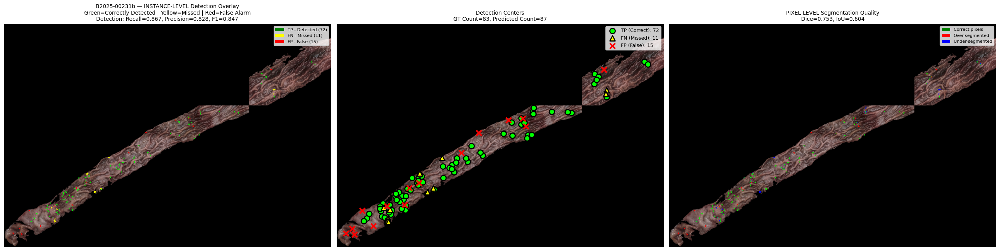


Processing B2025-00143b ...
  SEG  Dice=0.765, IoU=0.619, P=0.760, R=0.770
  DET  R=0.768, P=0.803, F1=0.785
       GT=69 Pred=66  TP=53 FN=16 FP=13


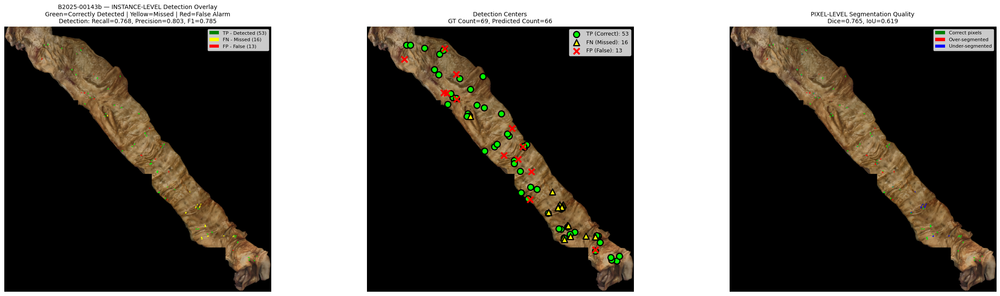


Processing B2025-00206b ...
  SEG  Dice=0.770, IoU=0.627, P=0.721, R=0.828
  DET  R=0.946, P=0.814, F1=0.875
       GT=37 Pred=43  TP=35 FN=2 FP=8


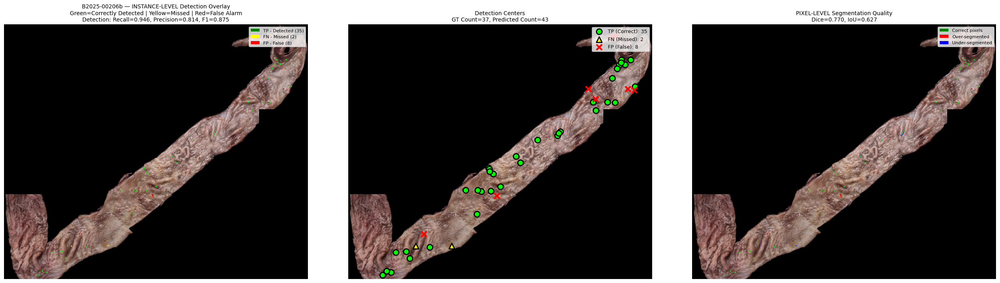


Processing B2025-00136b ...
  SEG  Dice=0.826, IoU=0.704, P=0.841, R=0.813
  DET  R=0.776, P=0.886, F1=0.827
       GT=321 Pred=281  TP=249 FN=72 FP=32


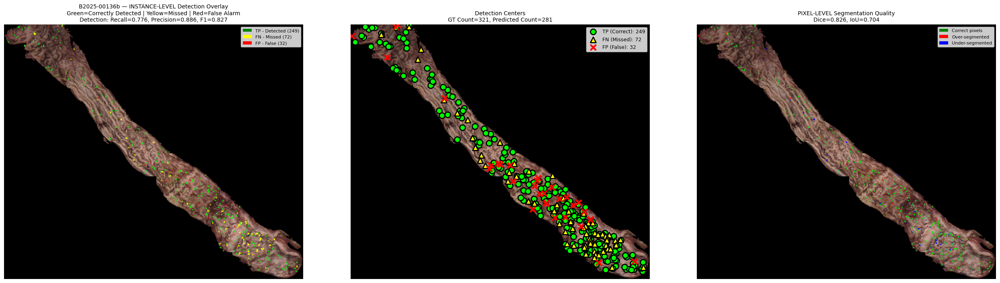


Processing B2025-00085.2 ...
  SEG  Dice=0.685, IoU=0.521, P=0.567, R=0.864
  DET  R=0.764, P=0.885, F1=0.820
       GT=263 Pred=227  TP=201 FN=62 FP=26


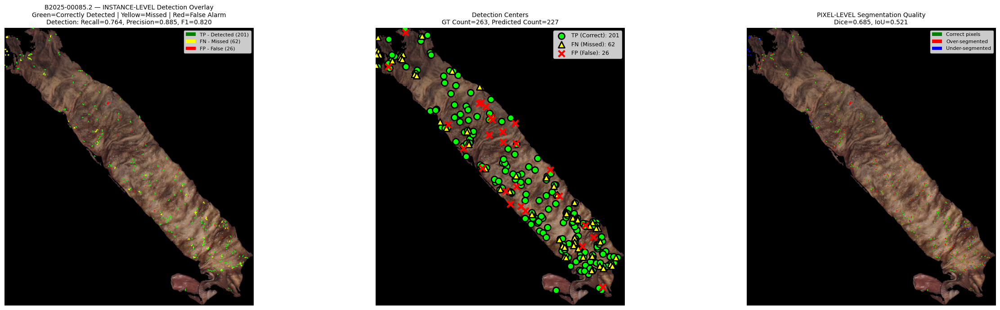


Processing B2025-00142a ...
  SEG  Dice=0.825, IoU=0.702, P=0.780, R=0.876
  DET  R=1.000, P=0.857, F1=0.923
       GT=6 Pred=7  TP=6 FN=0 FP=1


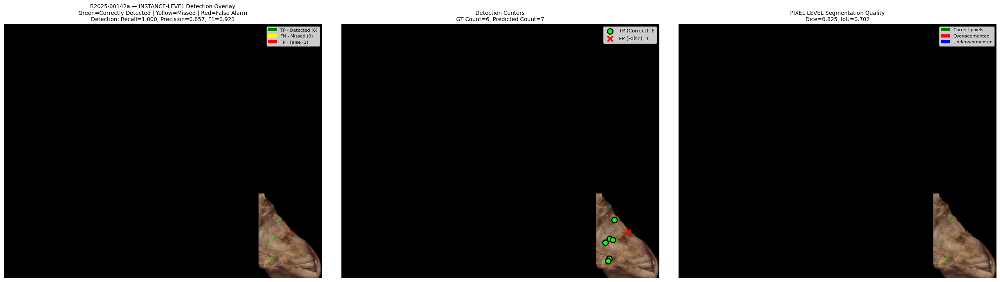


METRIC                         VALUE           DESCRIPTION
----------------------------------------------------------------------------------------------------

PIXEL-LEVEL SEGMENTATION METRICS (averaged across images):
----------------------------------------------------------------------------------------------------
Dice Coefficient               0.7708          Overlap quality (higher = better)
IoU (Jaccard Index)            0.6295          Intersection over Union
Pixel Precision                0.7351          Correct parasite pixels / Predicted parasite pixels
Pixel Recall                   0.8191          Correct parasite pixels / GT parasite pixels

INSTANCE-LEVEL DETECTION METRICS (total counts across all images):
----------------------------------------------------------------------------------------------------
Total GT Parasites             779             Ground truth parasite count
Total Predicted                711             Model predicted count
True Positives (TP)   

In [ ]:
evaluate_full_images(fine_tuner=eval_fine_tuner,
                     splits=splits,
                     test_dataset=test_dataset)

In [18]:
def count_parasites_prediction_with_visualization(pred_mask, min_size=2, max_size=None,
                                                   use_separation=True, separation_threshold=0.1):
    """
    Same as count_parasites_prediction but returns intermediate steps for visualization.
    """
    intermediates = {}

    # Step 0: Input mask
    if pred_mask.dtype == bool:
        binary_mask = pred_mask.astype(np.uint8) * 255
    elif pred_mask.max() <= 1:
        binary_mask = (pred_mask > 0).astype(np.uint8) * 255
    else:
        binary_mask = (pred_mask > 127).astype(np.uint8) * 255

    intermediates['0_input'] = binary_mask.copy()

    if np.sum(binary_mask > 0) == 0:
        return 0, [], binary_mask, np.zeros_like(binary_mask), intermediates

    # Step 1: Erosion
    kernel_erode = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    eroded = cv2.erode(binary_mask, kernel_erode, iterations=1)
    intermediates['1_eroded'] = eroded.copy()

    if use_separation:
        # Step 2: Opening
        kernel_open = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2, 2))
        opened = cv2.morphologyEx(eroded, cv2.MORPH_OPEN, kernel_open, iterations=1)
        intermediates['2_opened'] = opened.copy()

        # Step 3: Distance transform
        dist_transform = cv2.distanceTransform(opened, cv2.DIST_L2, 5)
        intermediates['3_distance_transform'] = dist_transform.copy()

        # Step 4: Thresholded peaks
        dist_max = dist_transform.max()
        if dist_max > 0:
            threshold_value = dist_max * separation_threshold
            _, sure_fg = cv2.threshold(dist_transform, threshold_value, 255, cv2.THRESH_BINARY)
        else:
            sure_fg = opened.copy()

        sure_fg = sure_fg.astype(np.uint8)
        intermediates['4_thresholded_peaks'] = sure_fg.copy()
        counting_mask = sure_fg
    else:
        counting_mask = eroded

    # Step 5: Connected components
    num_labels, labels = cv2.connectedComponents(counting_mask)
    intermediates['5_connected_components'] = labels.copy()

    centers = []
    valid_labels = []

    for label_id in range(1, num_labels):
        component_mask = (labels == label_id)
        component_size = np.sum(component_mask)

        if component_size < min_size:
            continue
        if max_size is not None and component_size > max_size:
            continue

        ys, xs = np.where(component_mask)
        if len(xs) > 0:
            centers.append((int(xs.mean()), int(ys.mean())))
            valid_labels.append(label_id)

    parasite_count = len(centers)
    separated_mask = np.isin(labels, valid_labels).astype(np.uint8) * 255
    intermediates['6_final_mask'] = separated_mask.copy()
    intermediates['centers'] = centers

    return parasite_count, centers, separated_mask, labels, intermediates

In [27]:
def visualize_postprocessing_pipeline(original_image, intermediates, figsize=(20, 10)):
    """
    Visualize all post-processing steps including original image.
    """
    fig, axes = plt.subplots(2, 4, figsize=figsize)
    axes = axes.flatten()

    # Step 0: Original image
    ax = axes[0]
    if isinstance(original_image, torch.Tensor):
        # Convert from (C, H, W) to (H, W, C)
        img_display = original_image.cpu().permute(1, 2, 0).numpy()
        # Just clip to [0,1] - no ImageNet denormalization
        img_display = np.clip(img_display, 0, 1)
    else:
        img_display = original_image
    ax.imshow(img_display)
    ax.set_title('Original Image', fontsize=11)
    ax.axis('off')

    steps = [
        ('0_input', 'SAM Prediction', 'gray'),
        ('1_eroded', 'After Erosion (5×5)', 'gray'),
        ('2_opened', 'After Opening (2×2)', 'gray'),
        ('3_distance_transform', 'Distance Transform', 'hot'),
        ('4_thresholded_peaks', 'Thresholded Peaks (10%)', 'gray'),
        ('5_connected_components', 'Connected Components', 'nipy_spectral'),
        ('6_final_mask', 'Final Mask + Centroids', 'gray'),
    ]

    for idx, (key, title, cmap) in enumerate(steps):
        ax = axes[idx + 1]
        img = intermediates[key]

        if key == '3_distance_transform':
            im = ax.imshow(img, cmap=cmap)
            plt.colorbar(im, ax=ax, fraction=0.046)
        elif key == '5_connected_components':
            ax.imshow(img, cmap=cmap, interpolation='nearest')
        else:
            ax.imshow(img, cmap=cmap)

        if key == '6_final_mask' and 'centers' in intermediates:
            centers = intermediates['centers']
            for (cx, cy) in centers:
                ax.plot(cx, cy, 'r+', markersize=8, markeredgewidth=2)

        ax.set_title(title, fontsize=11)
        ax.axis('off')

    plt.suptitle(f'Post-Processing Pipeline → {len(intermediates.get("centers", []))} parasites detected',
                 fontsize=14, fontweight='bold')
    plt.tight_layout()
    return fig

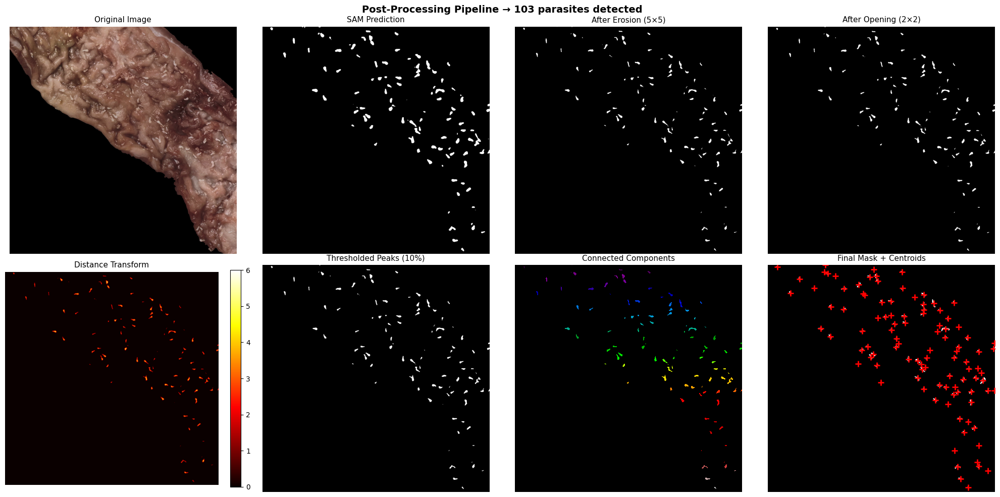

Detected 103 parasites


In [35]:
# Get a sample from dataset
sample = test_dataset[23]
image_tensor = sample['image'].unsqueeze(0).to(device)

# Get prediction
pred_mask = predict_mask(eval_fine_tuner, image_tensor)

# Run post-processing with visualization
count, centers, final_mask, labels, intermediates = count_parasites_prediction_with_visualization(pred_mask)

# Visualize with original image
fig = visualize_postprocessing_pipeline(sample['image'], intermediates)
plt.savefig('postprocessing_pipeline.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"Detected {count} parasites")

## Exp 6 - Aug, LoRA 32, AdamW, pos_weight=2.0

In [ ]:
import torch.serialization
torch.serialization.add_safe_globals([np.core.multiarray.scalar])

# Load best checkpoint
best_checkpoint_path = "/content/drive/MyDrive/SAM_Parasite_Detection/checkpoints/32_aug_pos/sam_best.pth"
checkpoint = torch.load(best_checkpoint_path, map_location=device, weights_only=False)

print(f"Loaded best model from epoch {checkpoint['epoch']}")

sam_model, device = load_sam_model()

# Create fine_tuner with same config as training
eval_fine_tuner = SAMFineTuner_LoRA(
    sam_model=sam_model,
    lora_rank=checkpoint['lora_rank'],
    learning_rate=1e-4,
    bce_weight=checkpoint['bce_weight'],
    dice_weight=checkpoint['dice_weight'],
    device=device
)

# Load the trained weights
eval_fine_tuner.sam.load_state_dict(checkpoint['model_state_dict'])
with torch.no_grad():
    eval_fine_tuner.sam.eval()

Loaded best model from epoch 18
Applied LoRA (rank=32) to 12 transformer blocks
Trainable parameters:    5,237,988 (5.52%)
  - LoRA parameters:     1,179,648
  - Decoder parameters:  4,058,340



Processing B2025-00231b ...
  SEG  Dice=0.764, IoU=0.618, P=0.755, R=0.773
  DET  R=0.843, P=0.854, F1=0.848
       GT=83 Pred=82  TP=70 FN=13 FP=12


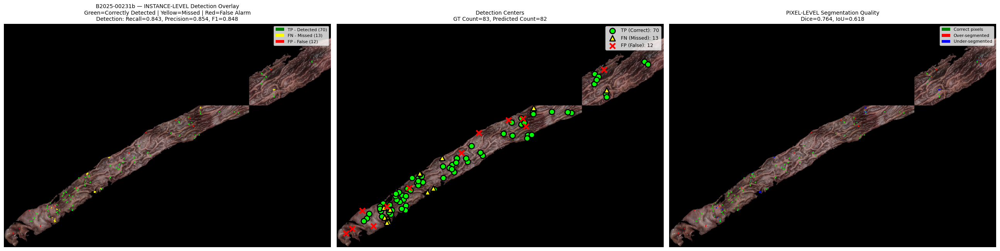


Processing B2025-00143b ...
  SEG  Dice=0.750, IoU=0.601, P=0.774, R=0.728
  DET  R=0.754, P=0.812, F1=0.782
       GT=69 Pred=64  TP=52 FN=17 FP=12


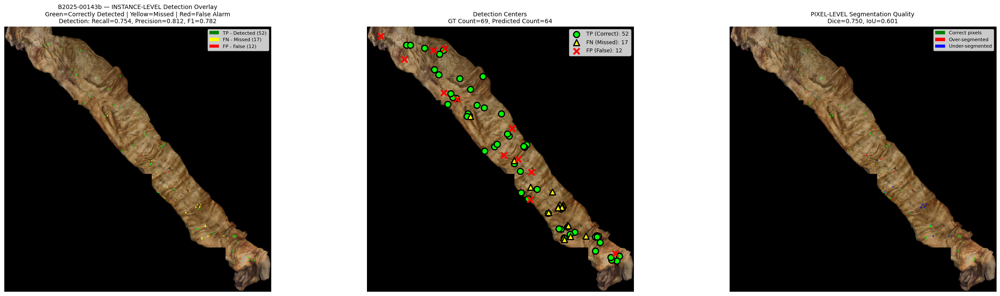


Processing B2025-00206b ...
  SEG  Dice=0.816, IoU=0.689, P=0.783, R=0.851
  DET  R=0.946, P=0.854, F1=0.897
       GT=37 Pred=41  TP=35 FN=2 FP=6


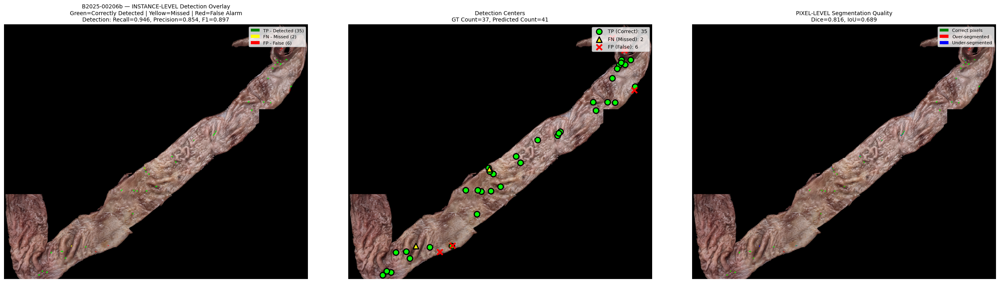


Processing B2025-00136b ...
  SEG  Dice=0.823, IoU=0.699, P=0.840, R=0.806
  DET  R=0.773, P=0.919, F1=0.839
       GT=321 Pred=270  TP=248 FN=73 FP=22


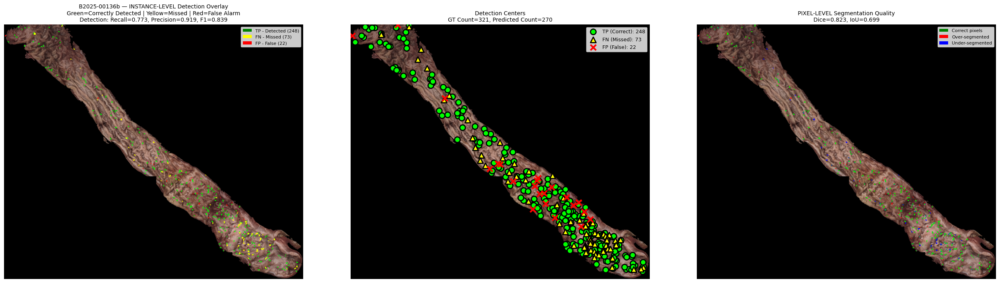


Processing B2025-00085.2 ...
  SEG  Dice=0.683, IoU=0.519, P=0.566, R=0.861
  DET  R=0.741, P=0.911, F1=0.818
       GT=263 Pred=214  TP=195 FN=68 FP=19


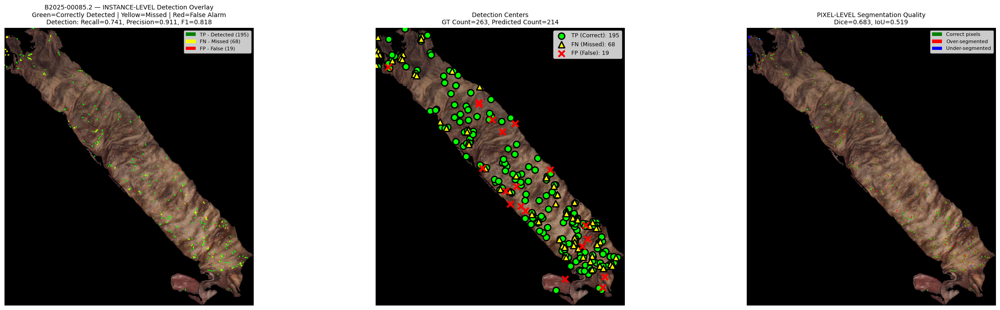


Processing B2025-00142a ...
  SEG  Dice=0.678, IoU=0.513, P=0.741, R=0.626
  DET  R=0.667, P=0.800, F1=0.727
       GT=6 Pred=5  TP=4 FN=2 FP=1


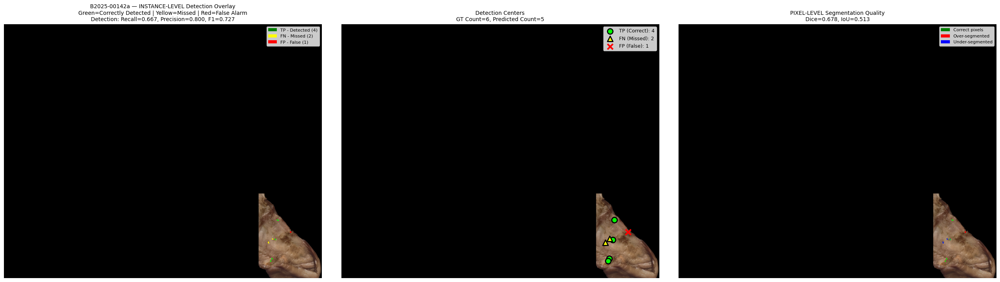


METRIC                         VALUE           DESCRIPTION
----------------------------------------------------------------------------------------------------

PIXEL-LEVEL SEGMENTATION METRICS (averaged across images):
----------------------------------------------------------------------------------------------------
Dice Coefficient               0.7524          Overlap quality (higher = better)
IoU (Jaccard Index)            0.6064          Intersection over Union
Pixel Precision                0.7433          Correct parasite pixels / Predicted parasite pixels
Pixel Recall                   0.7741          Correct parasite pixels / GT parasite pixels

INSTANCE-LEVEL DETECTION METRICS (total counts across all images):
----------------------------------------------------------------------------------------------------
Total GT Parasites             779             Ground truth parasite count
Total Predicted                676             Model predicted count
True Positives (TP)   

In [ ]:
evaluate_full_images(fine_tuner=eval_fine_tuner,
                     splits=splits,
                     test_dataset=test_dataset)

## Exp 8 - augm, LoRA 32, AdamW (selected by Recall)



In [ ]:
import torch.serialization
torch.serialization.add_safe_globals([np.core.multiarray.scalar])

# Load best checkpoint
best_checkpoint_path = "/content/drive/MyDrive/SAM_Parasite_Detection/checkpoints/32_augm_recall/sam_best.pth"
checkpoint = torch.load(best_checkpoint_path, map_location=device, weights_only=False)

print(f"Loaded best model from epoch {checkpoint['epoch']}")

sam_model, device = load_sam_model()

# Create fine_tuner with same config as training
eval_fine_tuner = SAMFineTuner_LoRA(
    sam_model=sam_model,
    lora_rank=checkpoint['lora_rank'],
    learning_rate=1e-4,
    bce_weight=checkpoint['bce_weight'],
    dice_weight=checkpoint['dice_weight'],
    device=device
)

# Load the trained weights
eval_fine_tuner.sam.load_state_dict(checkpoint['model_state_dict'])
with torch.no_grad():
    eval_fine_tuner.sam.eval()

Loaded best model from epoch 4
Applied LoRA (rank=32) to 12 transformer blocks
Trainable parameters:    5,237,988 (5.52%)
  - LoRA parameters:     1,179,648
  - Decoder parameters:  4,058,340



Processing B2025-00231b ...
  SEG  Dice=0.735, IoU=0.581, P=0.658, R=0.833
  DET  R=0.880, P=0.768, F1=0.820
       GT=83 Pred=95  TP=73 FN=10 FP=22


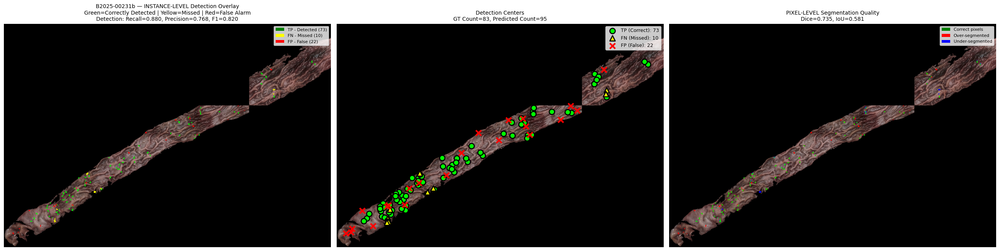


Processing B2025-00143b ...
  SEG  Dice=0.727, IoU=0.571, P=0.623, R=0.873
  DET  R=0.812, P=0.622, F1=0.704
       GT=69 Pred=90  TP=56 FN=13 FP=34


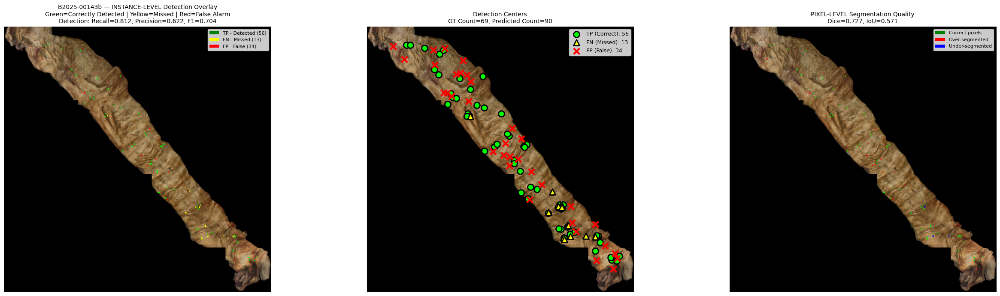


Processing B2025-00206b ...
  SEG  Dice=0.742, IoU=0.590, P=0.642, R=0.877
  DET  R=0.892, P=0.702, F1=0.786
       GT=37 Pred=47  TP=33 FN=4 FP=14


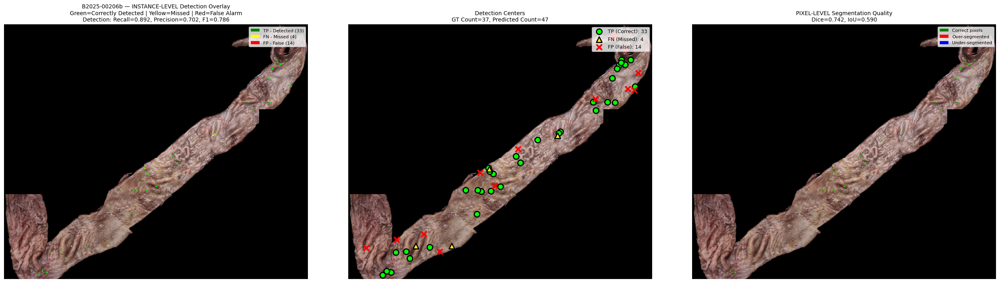


Processing B2025-00136b ...
  SEG  Dice=0.809, IoU=0.679, P=0.761, R=0.863
  DET  R=0.776, P=0.844, F1=0.808
       GT=321 Pred=295  TP=249 FN=72 FP=46


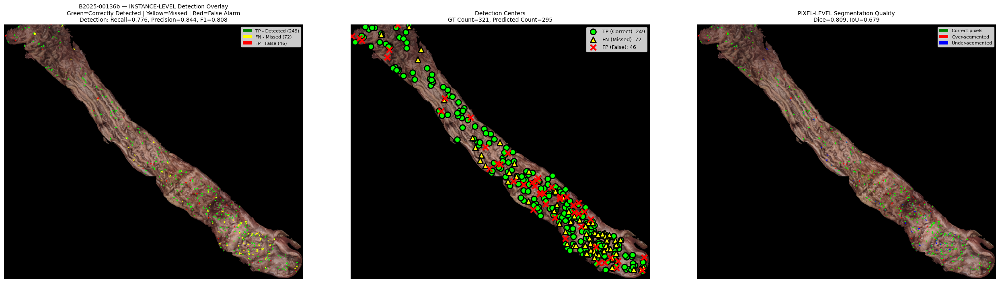


Processing B2025-00085.2 ...
  SEG  Dice=0.649, IoU=0.480, P=0.514, R=0.879
  DET  R=0.745, P=0.875, F1=0.805
       GT=263 Pred=224  TP=196 FN=67 FP=28


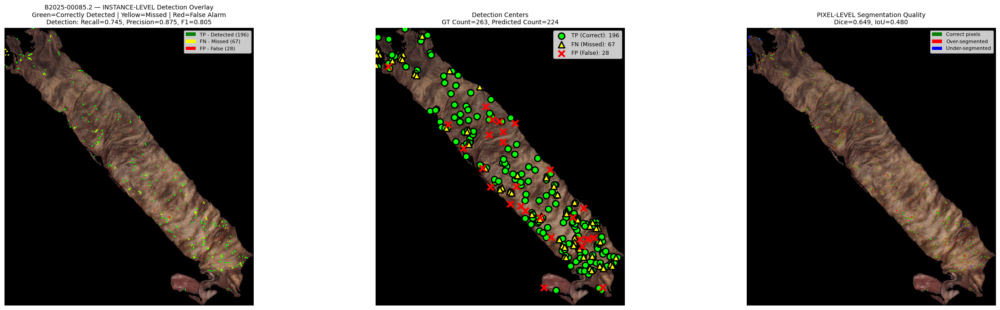


Processing B2025-00142a ...
  SEG  Dice=0.699, IoU=0.537, P=0.710, R=0.688
  DET  R=0.833, P=0.833, F1=0.833
       GT=6 Pred=6  TP=5 FN=1 FP=1


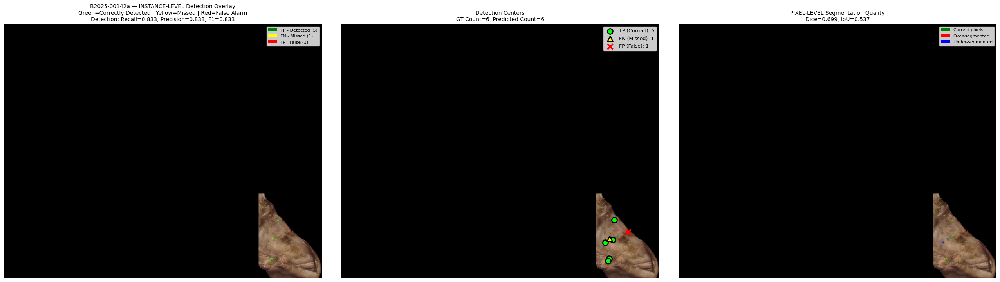


METRIC                         VALUE           DESCRIPTION
----------------------------------------------------------------------------------------------------

PIXEL-LEVEL SEGMENTATION METRICS (averaged across images):
----------------------------------------------------------------------------------------------------
Dice Coefficient               0.7267          Overlap quality (higher = better)
IoU (Jaccard Index)            0.5730          Intersection over Union
Pixel Precision                0.6514          Correct parasite pixels / Predicted parasite pixels
Pixel Recall                   0.8355          Correct parasite pixels / GT parasite pixels

INSTANCE-LEVEL DETECTION METRICS (total counts across all images):
----------------------------------------------------------------------------------------------------
Total GT Parasites             779             Ground truth parasite count
Total Predicted                757             Model predicted count
True Positives (TP)   

In [ ]:
evaluate_full_images(fine_tuner=eval_fine_tuner,
                     splits=splits,
                     test_dataset=test_dataset)

## Exp 14 - Focal Loss, LoRA 32, Adam, scheduler = cosine

In [ ]:
import torch.serialization
torch.serialization.add_safe_globals([np.core.multiarray.scalar])

# Load best checkpoint
best_checkpoint_path = "/content/drive/MyDrive/SAM_Parasite_Detection/checkpoints/focal_cosine/sam_best.pth"
checkpoint = torch.load(best_checkpoint_path, map_location=device, weights_only=False)

print(f"Loaded best model from epoch {checkpoint['epoch']}")

sam_model, device = load_sam_model()

# Create fine_tuner with same config as training
eval_fine_tuner = SAMFineTuner_LoRA(
    sam_model=sam_model,
    lora_rank=checkpoint['lora_rank'],
    learning_rate=1e-4,
    bce_weight=checkpoint['bce_weight'],
    dice_weight=checkpoint['dice_weight'],
    device=device
)

# Load the trained weights
eval_fine_tuner.sam.load_state_dict(checkpoint['model_state_dict'])
with torch.no_grad():
    eval_fine_tuner.sam.eval()

Loaded best model from epoch 30
Applied LoRA (rank=32) to 12 transformer blocks
Trainable parameters:    5,237,988 (5.52%)
  - LoRA parameters:     1,179,648
  - Decoder parameters:  4,058,340



Processing B2025-00231b ...
  SEG  Dice=0.759, IoU=0.612, P=0.800, R=0.722
  DET  R=0.807, P=0.859, F1=0.832
       GT=83 Pred=78  TP=67 FN=16 FP=11


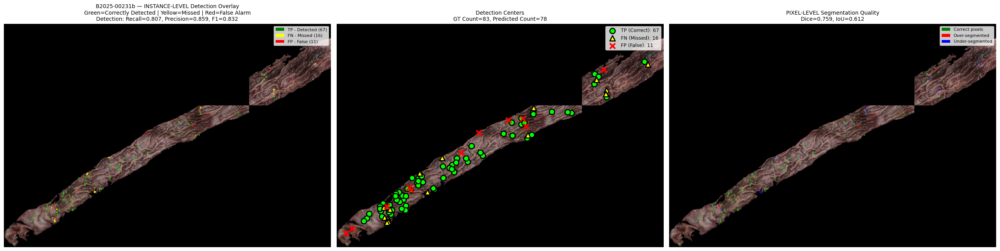


Processing B2025-00143b ...
  SEG  Dice=0.732, IoU=0.577, P=0.816, R=0.663
  DET  R=0.739, P=0.850, F1=0.791
       GT=69 Pred=60  TP=51 FN=18 FP=9


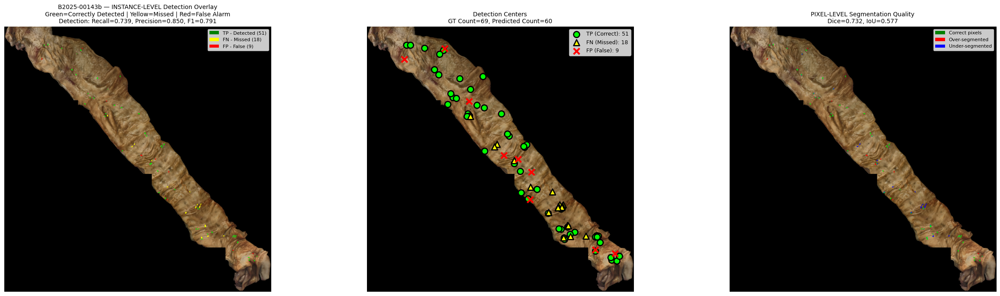


Processing B2025-00206b ...
  SEG  Dice=0.830, IoU=0.710, P=0.880, R=0.786
  DET  R=0.919, P=0.944, F1=0.932
       GT=37 Pred=36  TP=34 FN=3 FP=2


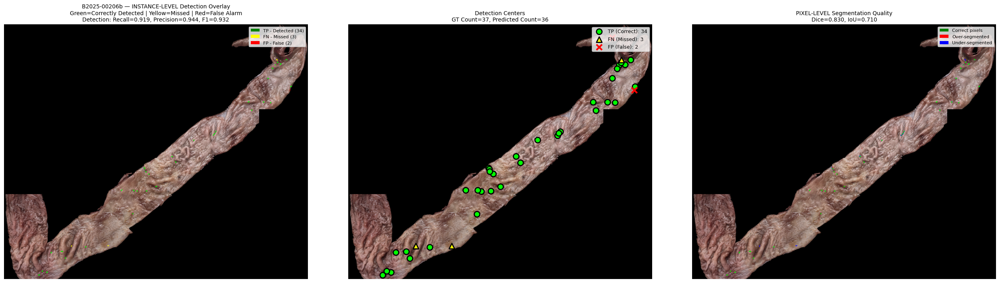


Processing B2025-00136b ...
  SEG  Dice=0.841, IoU=0.725, P=0.885, R=0.801
  DET  R=0.763, P=0.939, F1=0.842
       GT=321 Pred=261  TP=245 FN=76 FP=16


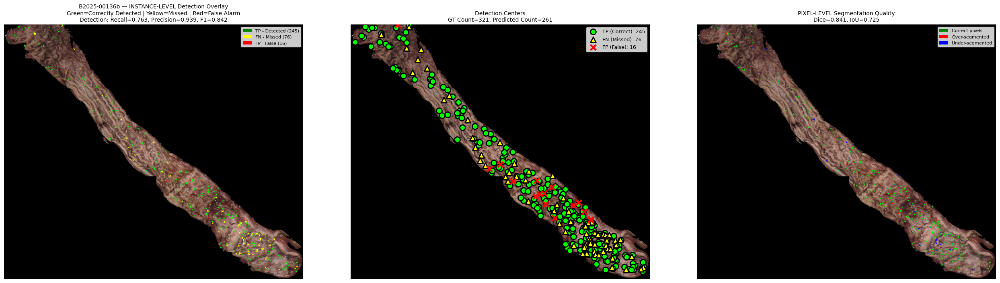


Processing B2025-00085.2 ...
  SEG  Dice=0.702, IoU=0.541, P=0.596, R=0.852
  DET  R=0.753, P=0.952, F1=0.841
       GT=263 Pred=208  TP=198 FN=65 FP=10


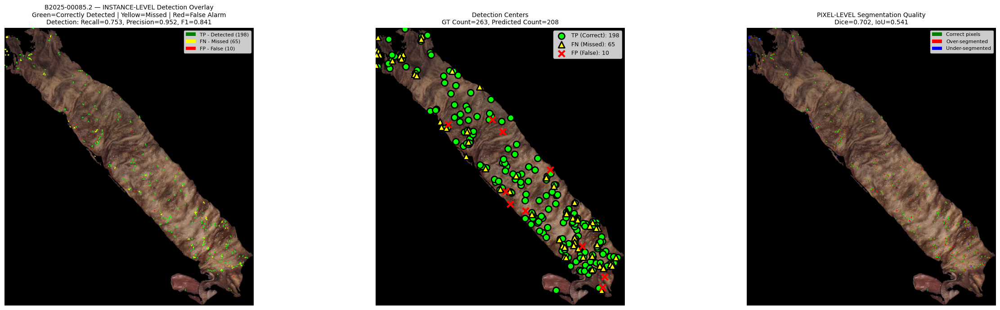


Processing B2025-00142a ...
  SEG  Dice=0.760, IoU=0.613, P=0.796, R=0.727
  DET  R=0.833, P=0.833, F1=0.833
       GT=6 Pred=6  TP=5 FN=1 FP=1


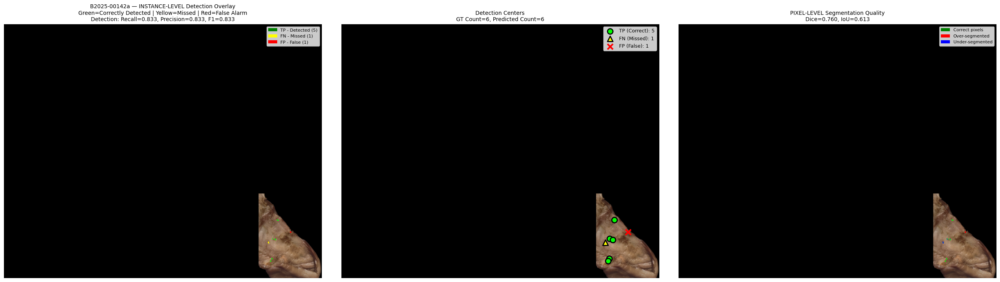


METRIC                         VALUE           DESCRIPTION
----------------------------------------------------------------------------------------------------

PIXEL-LEVEL SEGMENTATION METRICS (averaged across images):
----------------------------------------------------------------------------------------------------
Dice Coefficient               0.7706          Overlap quality (higher = better)
IoU (Jaccard Index)            0.6295          Intersection over Union
Pixel Precision                0.7958          Correct parasite pixels / Predicted parasite pixels
Pixel Recall                   0.7584          Correct parasite pixels / GT parasite pixels

INSTANCE-LEVEL DETECTION METRICS (total counts across all images):
----------------------------------------------------------------------------------------------------
Total GT Parasites             779             Ground truth parasite count
Total Predicted                649             Model predicted count
True Positives (TP)   

In [ ]:
evaluate_full_images(fine_tuner=eval_fine_tuner,
                     splits=splits,
                     test_dataset=test_dataset)

## Exp 12 - Focal Loss, LoRA 64, Adam

In [ ]:
import torch.serialization
torch.serialization.add_safe_globals([np.core.multiarray.scalar])

# Load best checkpoint
best_checkpoint_path = "/content/drive/MyDrive/SAM_Parasite_Detection/checkpoints/64_focal_new_split_LoRA_Baseline/sam_best.pth"
checkpoint = torch.load(best_checkpoint_path, map_location=device, weights_only=False)

print(f"Loaded best model from epoch {checkpoint['epoch']}")

sam_model, device = load_sam_model()

# Create fine_tuner with same config as training
eval_fine_tuner = SAMFineTuner_LoRA(
    sam_model=sam_model,
    lora_rank=checkpoint['lora_rank'],
    learning_rate=1e-4,
    bce_weight=checkpoint['bce_weight'],
    dice_weight=checkpoint['dice_weight'],
    device=device
)

# Load the trained weights
eval_fine_tuner.sam.load_state_dict(checkpoint['model_state_dict'])
with torch.no_grad():
    eval_fine_tuner.sam.eval()

Loaded best model from epoch 9
Applied LoRA (rank=64) to 12 transformer blocks
Trainable parameters:    6,417,636 (6.68%)
  - LoRA parameters:     2,359,296
  - Decoder parameters:  4,058,340



Processing B2025-00231b ...
  SEG  Dice=0.759, IoU=0.611, P=0.748, R=0.770
  DET  R=0.855, P=0.826, F1=0.840
       GT=83 Pred=86  TP=71 FN=12 FP=15


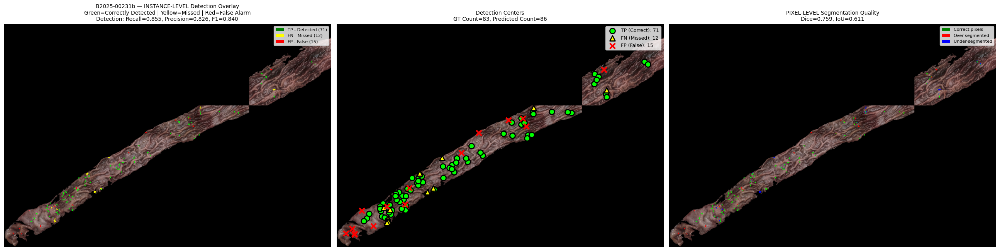


Processing B2025-00143b ...
  SEG  Dice=0.734, IoU=0.579, P=0.746, R=0.721
  DET  R=0.725, P=0.806, F1=0.763
       GT=69 Pred=62  TP=50 FN=19 FP=12


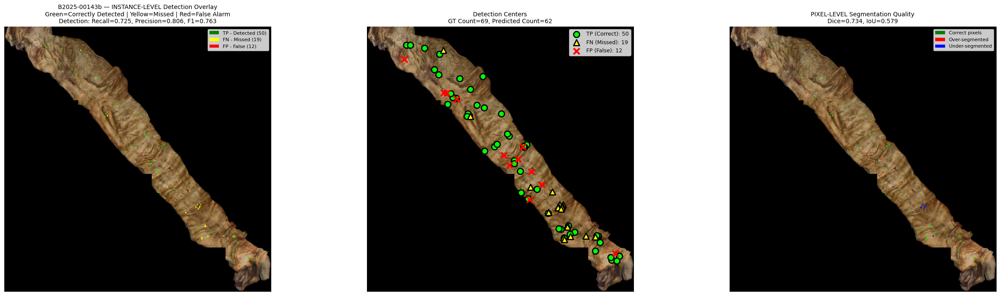


Processing B2025-00206b ...
  SEG  Dice=0.802, IoU=0.670, P=0.790, R=0.815
  DET  R=0.946, P=0.875, F1=0.909
       GT=37 Pred=40  TP=35 FN=2 FP=5


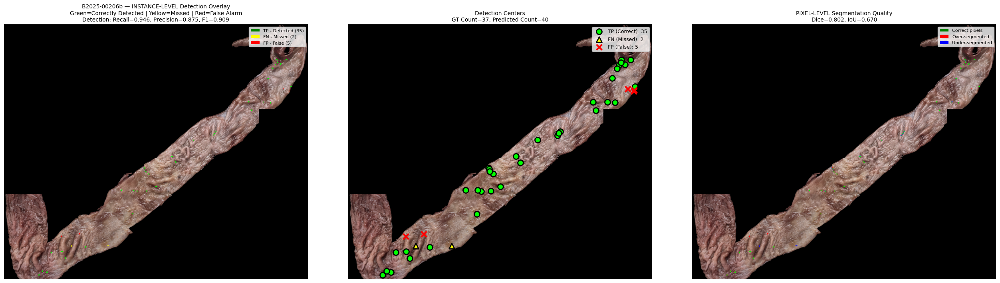


Processing B2025-00136b ...
  SEG  Dice=0.815, IoU=0.687, P=0.832, R=0.798
  DET  R=0.763, P=0.911, F1=0.831
       GT=321 Pred=269  TP=245 FN=76 FP=24


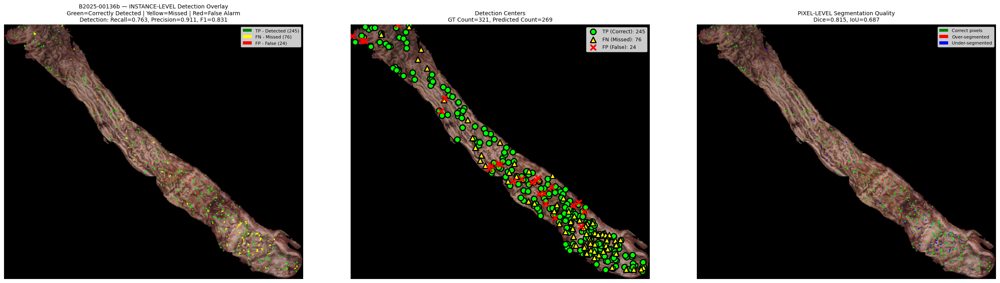


Processing B2025-00085.2 ...
  SEG  Dice=0.678, IoU=0.513, P=0.564, R=0.849
  DET  R=0.700, P=0.925, F1=0.797
       GT=263 Pred=199  TP=184 FN=79 FP=15


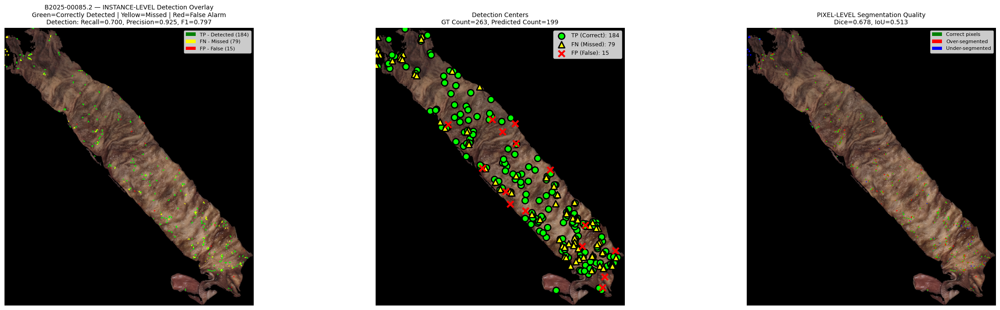


Processing B2025-00142a ...
  SEG  Dice=0.816, IoU=0.689, P=0.763, R=0.876
  DET  R=1.000, P=0.857, F1=0.923
       GT=6 Pred=7  TP=6 FN=0 FP=1


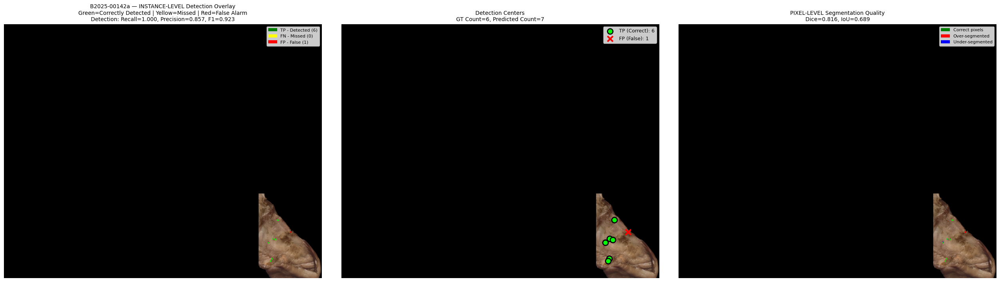


METRIC                         VALUE           DESCRIPTION
----------------------------------------------------------------------------------------------------

PIXEL-LEVEL SEGMENTATION METRICS (averaged across images):
----------------------------------------------------------------------------------------------------
Dice Coefficient               0.7672          Overlap quality (higher = better)
IoU (Jaccard Index)            0.6250          Intersection over Union
Pixel Precision                0.7407          Correct parasite pixels / Predicted parasite pixels
Pixel Recall                   0.8049          Correct parasite pixels / GT parasite pixels

INSTANCE-LEVEL DETECTION METRICS (total counts across all images):
----------------------------------------------------------------------------------------------------
Total GT Parasites             779             Ground truth parasite count
Total Predicted                663             Model predicted count
True Positives (TP)   

In [ ]:
evaluate_full_images(fine_tuner=eval_fine_tuner,
                     splits=splits,
                     test_dataset=test_dataset)

INSTANCE-LEVEL DETECTION METRICS (averaged across images):
----------------------------------------------------------------------------------------------------
Detection Recall               0.8315 ± 0.118  Mean ± std across images
Detection Precision            0.8667 ± 0.042  Mean ± std across images
Detection F1-Score             0.8439 ± 0.062  Mean ± std across images



## Post-processing

In [ ]:
# =============================================================================
# IMPROVED POST-PROCESSING FUNCTIONS
# =============================================================================

import numpy as np
import cv2
from scipy import ndimage as ndi
from scipy.optimize import linear_sum_assignment
from scipy.spatial.distance import cdist
from skimage.feature import peak_local_max
from skimage.segmentation import watershed

# -----------------------------------------------------------------------------
# 1. HUNGARIAN MATCHING (optimal matching)
# -----------------------------------------------------------------------------
def match_parasites(gt_centers, pred_centers, max_distance=20):
    """
    Optimal matching using Hungarian algorithm.
    """
    if len(gt_centers) == 0 and len(pred_centers) == 0:
        return [], [], []
    if len(gt_centers) == 0:
        return [], [], list(pred_centers)
    if len(pred_centers) == 0:
        return [], list(gt_centers), []

    gt_arr = np.array(gt_centers)
    pred_arr = np.array(pred_centers)

    cost_matrix = cdist(gt_arr, pred_arr)
    invalid_cost = max_distance * 10
    cost_matrix_masked = np.where(cost_matrix <= max_distance, cost_matrix, invalid_cost)

    row_ind, col_ind = linear_sum_assignment(cost_matrix_masked)

    TP = []
    matched_gt = set()
    matched_pred = set()

    for g, p in zip(row_ind, col_ind):
        if cost_matrix[g, p] <= max_distance:
            TP.append((tuple(gt_arr[g]), tuple(pred_arr[p]), float(cost_matrix[g, p])))
            matched_gt.add(g)
            matched_pred.add(p)

    FN = [tuple(gt_arr[g]) for g in range(len(gt_arr)) if g not in matched_gt]
    FP = [tuple(pred_arr[p]) for p in range(len(pred_arr)) if p not in matched_pred]

    return TP, FN, FP


# -----------------------------------------------------------------------------
# 2. SIZE-BASED COUNTING (splits large merged regions)
# -----------------------------------------------------------------------------
def count_parasites_prediction(pred_mask, min_size=2, max_size=None, size_multiplier=1.8):
    """
    Count parasites with size-based splitting for merged regions.

    Args:
        pred_mask: Binary prediction mask
        min_size: Minimum parasite size in pixels
        max_size: Maximum parasite size (optional)
        size_multiplier: Regions larger than median_size * this get split (default 1.8)

    Returns:
        count, centers, separated_mask, labels
    """
    # Normalize input
    if pred_mask.dtype == bool:
        binary_mask = pred_mask.astype(np.uint8) * 255
    elif pred_mask.max() <= 1:
        binary_mask = (pred_mask > 0).astype(np.uint8) * 255
    else:
        binary_mask = (pred_mask > 127).astype(np.uint8) * 255

    if np.sum(binary_mask > 0) == 0:
        return 0, [], binary_mask, np.zeros_like(binary_mask)

    # Light cleanup
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
    binary_clean = cv2.morphologyEx(binary_mask, cv2.MORPH_OPEN, kernel, iterations=1)

    # Label connected components
    num_labels, labels = cv2.connectedComponents(binary_clean)

    # Calculate sizes and find median
    sizes = []
    for i in range(1, num_labels):
        size = np.sum(labels == i)
        if size >= min_size:
            sizes.append(size)

    if len(sizes) == 0:
        return 0, [], binary_mask, labels

    median_size = np.median(sizes)
    threshold_size = median_size * size_multiplier

    centers = []
    output_labels = np.zeros_like(labels)
    next_label = 1

    for label_id in range(1, num_labels):
        component_mask = (labels == label_id).astype(np.uint8)
        component_size = np.sum(component_mask)

        if component_size < min_size:
            continue
        if max_size is not None and component_size > max_size:
            continue

        # Check if region is suspiciously large
        if component_size > threshold_size:
            estimated_count = int(round(component_size / median_size))

            if estimated_count >= 2:
                # Split using distance transform
                dist = ndi.distance_transform_edt(component_mask)
                min_dist = max(3, int(np.sqrt(median_size / np.pi) * 0.5))
                coords = peak_local_max(dist,
                                        min_distance=min_dist,
                                        num_peaks=estimated_count + 1,
                                        labels=component_mask)

                if len(coords) >= 2:
                    # Watershed split
                    markers = np.zeros_like(dist, dtype=np.int32)
                    for i, (y, x) in enumerate(coords, start=1):
                        markers[y, x] = i

                    sub_labels = watershed(-dist, markers, mask=component_mask)

                    for sub_id in range(1, sub_labels.max() + 1):
                        sub_mask = (sub_labels == sub_id)
                        if sub_mask.sum() >= min_size:
                            output_labels[sub_mask] = next_label
                            ys, xs = np.where(sub_mask)
                            centers.append((int(xs.mean()), int(ys.mean())))
                            next_label += 1
                    continue

        # Normal region - keep as single parasite
        output_labels[component_mask > 0] = next_label
        ys, xs = np.where(component_mask > 0)
        centers.append((int(xs.mean()), int(ys.mean())))
        next_label += 1

    separated_mask = (output_labels > 0).astype(np.uint8) * 255
    return len(centers), centers, separated_mask, output_labels


print(" Improved post-processing functions loaded!")
print("  - match_parasites: Hungarian algorithm")
print("  - count_parasites_prediction: Size-based splitting (multiplier=1.8)")

 Improved post-processing functions loaded!
  - match_parasites: Hungarian algorithm
  - count_parasites_prediction: Size-based splitting (multiplier=1.8)


## test the improved post-processing to exp 6


Processing B2025-00231b ...
  SEG  Dice=0.753, IoU=0.604, P=0.742, R=0.764
  DET  R=0.904, P=0.843, F1=0.872
       GT=83 Pred=89  TP=75 FN=8 FP=14


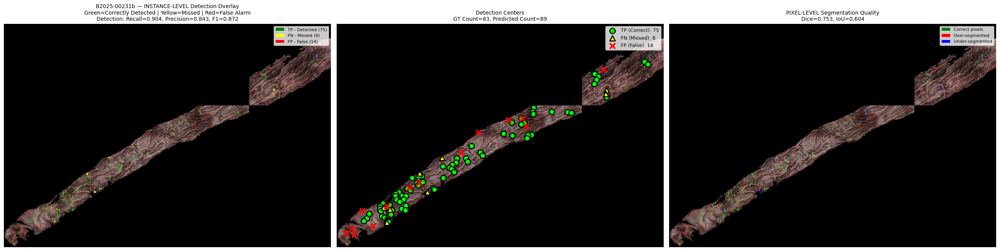


Processing B2025-00143b ...
  SEG  Dice=0.765, IoU=0.619, P=0.760, R=0.770
  DET  R=0.797, P=0.724, F1=0.759
       GT=69 Pred=76  TP=55 FN=14 FP=21


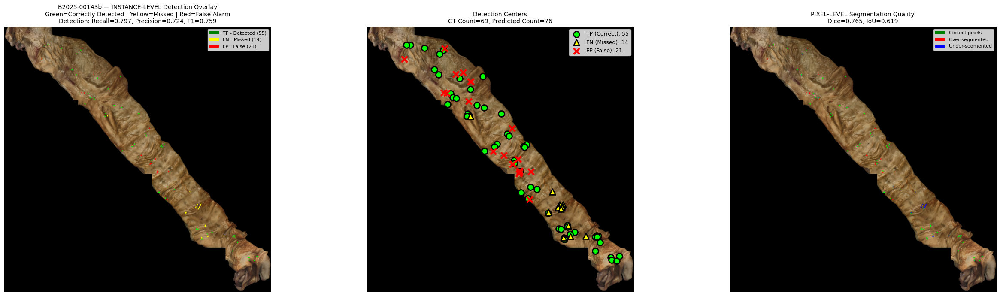


Processing B2025-00206b ...
  SEG  Dice=0.770, IoU=0.627, P=0.721, R=0.828
  DET  R=0.946, P=0.686, F1=0.795
       GT=37 Pred=51  TP=35 FN=2 FP=16


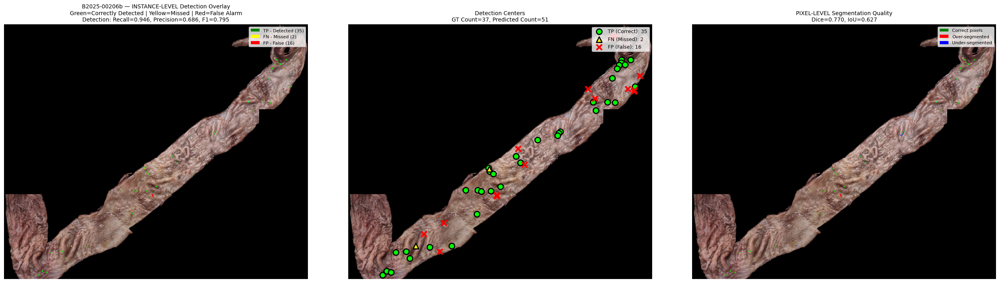


Processing B2025-00136b ...
  SEG  Dice=0.826, IoU=0.704, P=0.841, R=0.813
  DET  R=0.860, P=0.805, F1=0.831
       GT=321 Pred=343  TP=276 FN=45 FP=67


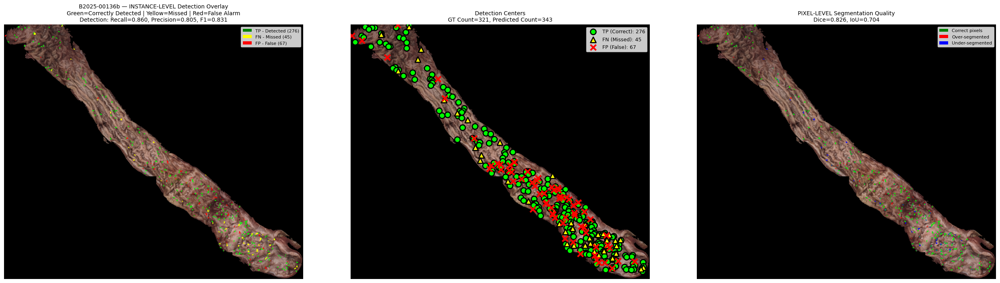


Processing B2025-00085.2 ...
  SEG  Dice=0.685, IoU=0.521, P=0.567, R=0.864
  DET  R=0.878, P=0.859, F1=0.868
       GT=263 Pred=269  TP=231 FN=32 FP=38


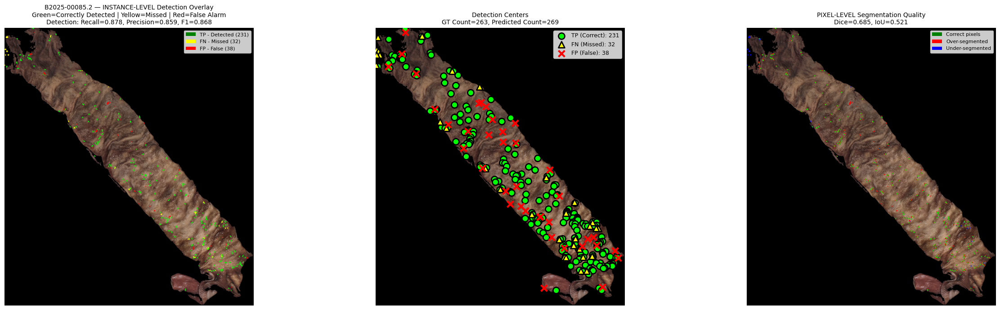


Processing B2025-00142a ...
  SEG  Dice=0.825, IoU=0.702, P=0.780, R=0.876
  DET  R=1.000, P=0.750, F1=0.857
       GT=6 Pred=8  TP=6 FN=0 FP=2


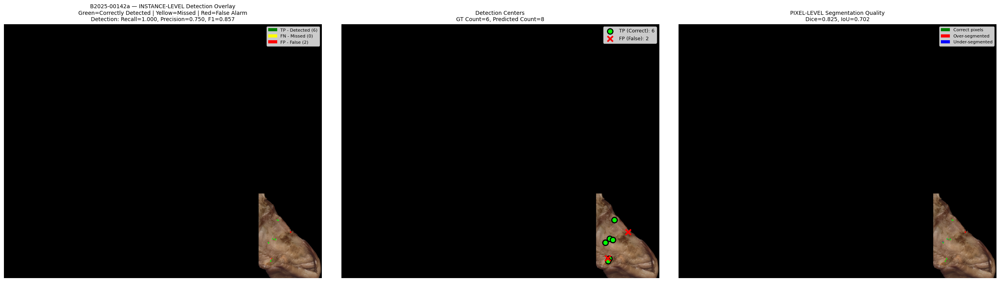


METRIC                         VALUE           DESCRIPTION
----------------------------------------------------------------------------------------------------

PIXEL-LEVEL SEGMENTATION METRICS (averaged across images):
----------------------------------------------------------------------------------------------------
Dice Coefficient               0.7708          Overlap quality (higher = better)
IoU (Jaccard Index)            0.6295          Intersection over Union
Pixel Precision                0.7351          Correct parasite pixels / Predicted parasite pixels
Pixel Recall                   0.8191          Correct parasite pixels / GT parasite pixels

INSTANCE-LEVEL DETECTION METRICS (total counts across all images):
----------------------------------------------------------------------------------------------------
Total GT Parasites             779             Ground truth parasite count
Total Predicted                836             Model predicted count
True Positives (TP)   

In [ ]:
evaluate_full_images(eval_fine_tuner, splits, test_dataset)


# Models

##